In [1]:
import numpy as np
import pandas as pd
from math import *
import sys
from sys import stdout as cout
from CFLib.timer import Timer
from CFLib.stats import stats
from CFLib.euro_opt import impVolFromFwPut
from CFLib.euro_opt import impVolFromFwCall
from scipy.stats import norm
import matplotlib.pyplot as plt

In [2]:
S_0 = 1
r = 0
q = 0
t = [1/12,2/12,3/12,6/12,1.0,1.5]
Strikes = [0.8,0.9,0.95,0.975,1.0,1.025,1.1,1.2]
sigma = [0.2, 0.3, 0.35, 0.4, 0.6]
delta = [0.2,0.4,0.6,0.8]
Yrs = 1.5  #length of the trajectory in years
Nt = int(360*Yrs)  #number of steps in the S trajectory
NS = 100000  #number of S trajectories

In [3]:
def gen_random_values(years, Nt, NS):

    W_t = np.zeros((NS, Nt+1))
    dt = years/Nt
    Rand = np.random.default_rng(2384) #2384 #3224 #224 #28264 #24284
    normal = Rand.normal(loc=0.0, scale=1.0, size=(NS, Nt+1))
    for i in range(1, Nt+1):
        W_t[:, i] = W_t[:, i-1] + np.sqrt(dt) * normal[:, i-1]

    return W_t


In [4]:
def S_t_process(S_0,Nt,NS,sigma,delta,years):
    
    dt = years/Nt
    X = np.ndarray(shape=(NS, Nt+1), dtype=np.double)
    W = gen_random_values(years, Nt, NS)
    X[:,0] = S_0 + delta
    for i in range(1,Nt+1):
        X[:,i] = X[:,0] * np.exp(-0.5 * sigma * sigma * i * dt + sigma*W[:,i])
    
    return X-delta
  

        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      0.00e+00        0.00e+00       0.1919 sec.
       30    1.000146      1.46e-04        3.62e-04       0.0111 sec.
       60    1.000139      1.39e-04        5.13e-04       0.0069 sec.
       90    1.000039      3.90e-05        6.31e-04       0.0067 sec.
      120    1.000257      2.57e-04        7.28e-04       0.0159 sec.
      150    1.000129      1.29e-04        8.13e-04       0.0286 sec.
      180    0.999798      2.02e-04        8.91e-04       0.0046 sec.
      210    0.999979      2.14e-05        9.64e-04       0.0048 sec.
      240    1.000282      2.82e-04        1.03e-03       0.0045 sec.
      270    1.000383      3.83e-04        1.10e-03       0.0047 sec.
      300    1.000088      8.82e-05        1.15e-03       0.0049 sec.
      330    1.000039      3.93e-05        1.21e-03       0.0104 sec.
      360    0.999916      8.39e-05        1.26e-03       0.0059 sec.
      390    1.000025  

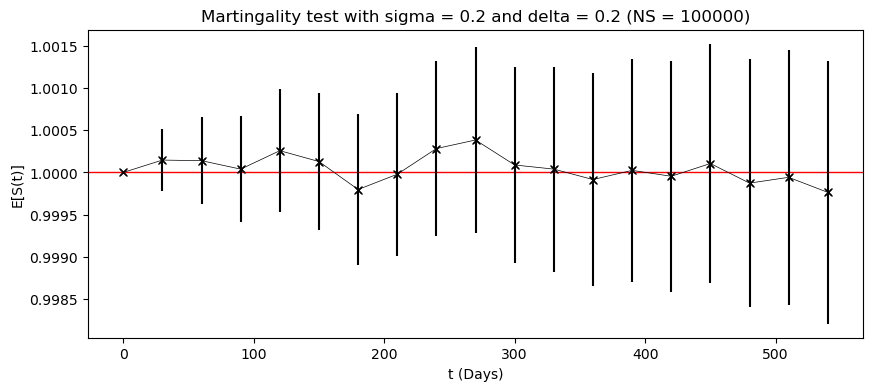



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      1.11e-16        0.00e+00       0.1719 sec.
       30    1.000171      1.71e-04        4.22e-04       0.0188 sec.
       60    1.000162      1.62e-04        5.99e-04       0.0043 sec.
       90    1.000046      4.55e-05        7.36e-04       0.0041 sec.
      120    1.000300      3.00e-04        8.50e-04       0.0043 sec.
      150    1.000150      1.50e-04        9.48e-04       0.0041 sec.
      180    0.999765      2.35e-04        1.04e-03       0.0040 sec.
      210    0.999975      2.50e-05        1.12e-03       0.0043 sec.
      240    1.000329      3.29e-04        1.20e-03       0.0040 sec.
      270    1.000447      4.47e-04        1.28e-03       0.0046 sec.
      300    1.000103      1.03e-04        1.35e-03       0.0040 sec.
      330    1.000046      4.58e-05        1.41e-03       0.0041 sec.
      360    0.999902      9.79e-05        1.48e-03       0.0041 sec.
      390    1.000029

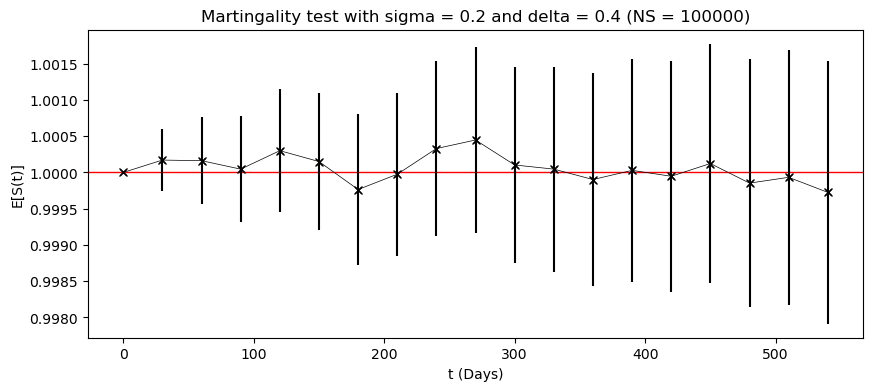



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      0.00e+00        0.00e+00       0.0233 sec.
       30    1.000195      1.95e-04        4.83e-04       0.0077 sec.
       60    1.000185      1.85e-04        6.84e-04       0.0061 sec.
       90    1.000052      5.20e-05        8.41e-04       0.0059 sec.
      120    1.000343      3.43e-04        9.71e-04       0.0064 sec.
      150    1.000172      1.72e-04        1.08e-03       0.0063 sec.
      180    0.999731      2.69e-04        1.19e-03       0.0075 sec.
      210    0.999971      2.85e-05        1.29e-03       0.0049 sec.
      240    1.000376      3.76e-04        1.38e-03       0.0055 sec.
      270    1.000511      5.11e-04        1.46e-03       0.0055 sec.
      300    1.000118      1.18e-04        1.54e-03       0.0049 sec.
      330    1.000052      5.24e-05        1.61e-03       0.0063 sec.
      360    0.999888      1.12e-04        1.69e-03       0.0110 sec.
      390    1.000033

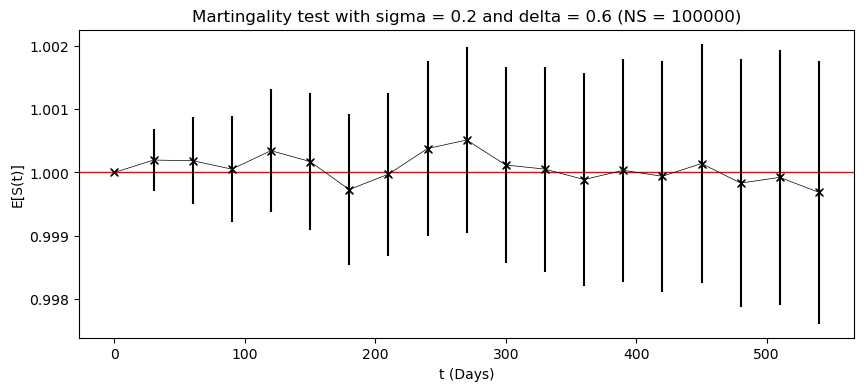



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      0.00e+00        0.00e+00       0.0196 sec.
       30    1.000219      2.19e-04        5.43e-04       0.0058 sec.
       60    1.000208      2.08e-04        7.70e-04       0.0043 sec.
       90    1.000059      5.85e-05        9.46e-04       0.0044 sec.
      120    1.000386      3.86e-04        1.09e-03       0.0040 sec.
      150    1.000193      1.93e-04        1.22e-03       0.0042 sec.
      180    0.999697      3.03e-04        1.34e-03       0.0042 sec.
      210    0.999968      3.21e-05        1.45e-03       0.0041 sec.
      240    1.000424      4.24e-04        1.55e-03       0.0042 sec.
      270    1.000575      5.75e-04        1.64e-03       0.0040 sec.
      300    1.000132      1.32e-04        1.73e-03       0.0040 sec.
      330    1.000059      5.89e-05        1.82e-03       0.0041 sec.
      360    0.999874      1.26e-04        1.90e-03       0.0040 sec.
      390    1.000037

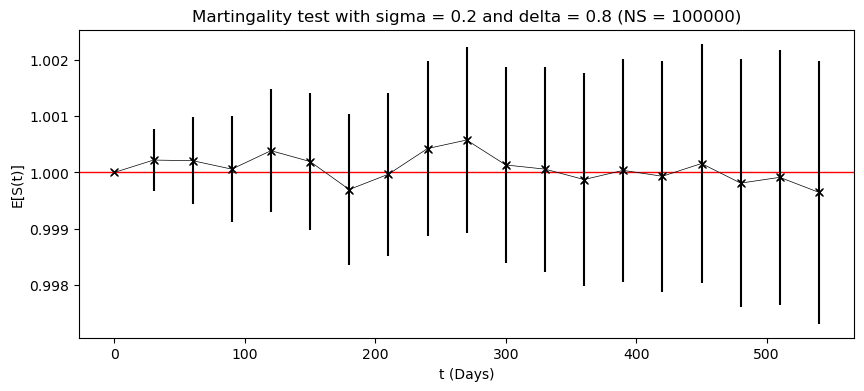



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      0.00e+00        0.00e+00       0.0225 sec.
       30    1.000221      2.21e-04        5.44e-04       0.0052 sec.
       60    1.000219      2.19e-04        7.71e-04       0.0041 sec.
       90    1.000103      1.03e-04        9.49e-04       0.0042 sec.
      120    1.000433      4.33e-04        1.10e-03       0.0042 sec.
      150    1.000211      2.11e-04        1.23e-03       0.0041 sec.
      180    0.999716      2.84e-04        1.34e-03       0.0043 sec.
      210    1.000013      1.34e-05        1.46e-03       0.0041 sec.
      240    1.000493      4.93e-04        1.56e-03       0.0040 sec.
      270    1.000645      6.45e-04        1.66e-03       0.0042 sec.
      300    1.000187      1.87e-04        1.75e-03       0.0041 sec.
      330    1.000087      8.71e-05        1.84e-03       0.0043 sec.
      360    0.999874      1.26e-04        1.92e-03       0.0042 sec.
      390    1.000037

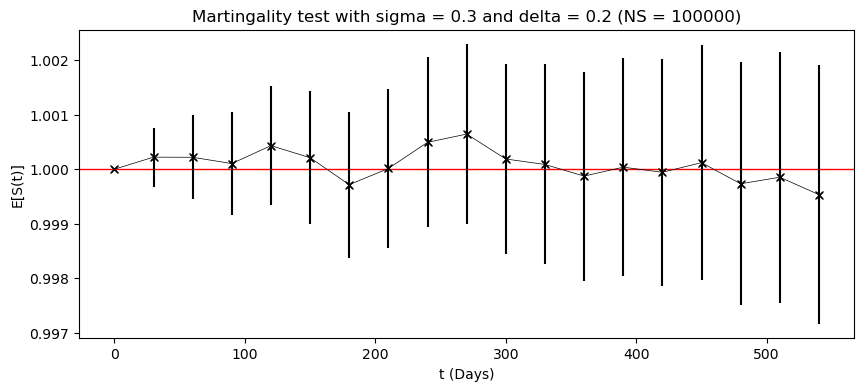



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      1.11e-16        0.00e+00       0.0338 sec.
       30    1.000258      2.58e-04        6.34e-04       0.0057 sec.
       60    1.000256      2.56e-04        9.00e-04       0.0043 sec.
       90    1.000121      1.21e-04        1.11e-03       0.0041 sec.
      120    1.000505      5.05e-04        1.28e-03       0.0041 sec.
      150    1.000246      2.46e-04        1.43e-03       0.0040 sec.
      180    0.999668      3.32e-04        1.57e-03       0.0046 sec.
      210    1.000016      1.57e-05        1.70e-03       0.0040 sec.
      240    1.000575      5.75e-04        1.82e-03       0.0040 sec.
      270    1.000753      7.53e-04        1.94e-03       0.0044 sec.
      300    1.000219      2.19e-04        2.04e-03       0.0041 sec.
      330    1.000102      1.02e-04        2.14e-03       0.0043 sec.
      360    0.999853      1.47e-04        2.24e-03       0.0042 sec.
      390    1.000043

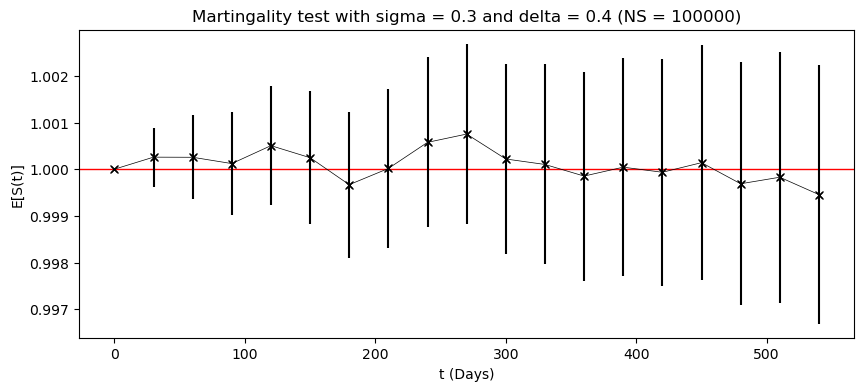



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      0.00e+00        0.00e+00       0.0273 sec.
       30    1.000295      2.95e-04        7.25e-04       0.0053 sec.
       60    1.000292      2.92e-04        1.03e-03       0.0041 sec.
       90    1.000138      1.38e-04        1.27e-03       0.0042 sec.
      120    1.000577      5.77e-04        1.46e-03       0.0040 sec.
      150    1.000282      2.82e-04        1.63e-03       0.0043 sec.
      180    0.999621      3.79e-04        1.79e-03       0.0041 sec.
      210    1.000018      1.79e-05        1.94e-03       0.0041 sec.
      240    1.000658      6.58e-04        2.08e-03       0.0040 sec.
      270    1.000860      8.60e-04        2.21e-03       0.0041 sec.
      300    1.000250      2.50e-04        2.33e-03       0.0043 sec.
      330    1.000116      1.16e-04        2.45e-03       0.0041 sec.
      360    0.999832      1.68e-04        2.56e-03       0.0040 sec.
      390    1.000050

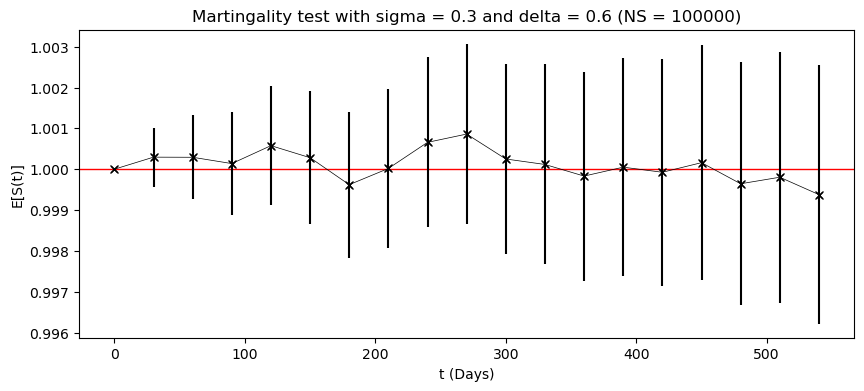



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      0.00e+00        0.00e+00       0.0290 sec.
       30    1.000332      3.32e-04        8.15e-04       0.0056 sec.
       60    1.000329      3.29e-04        1.16e-03       0.0042 sec.
       90    1.000155      1.55e-04        1.42e-03       0.0043 sec.
      120    1.000649      6.49e-04        1.65e-03       0.0040 sec.
      150    1.000317      3.17e-04        1.84e-03       0.0048 sec.
      180    0.999574      4.26e-04        2.02e-03       0.0054 sec.
      210    1.000020      2.02e-05        2.18e-03       0.0050 sec.
      240    1.000740      7.40e-04        2.34e-03       0.0049 sec.
      270    1.000968      9.68e-04        2.49e-03       0.0050 sec.
      300    1.000281      2.81e-04        2.63e-03       0.0047 sec.
      330    1.000131      1.31e-04        2.75e-03       0.0051 sec.
      360    0.999811      1.89e-04        2.88e-03       0.0053 sec.
      390    1.000056

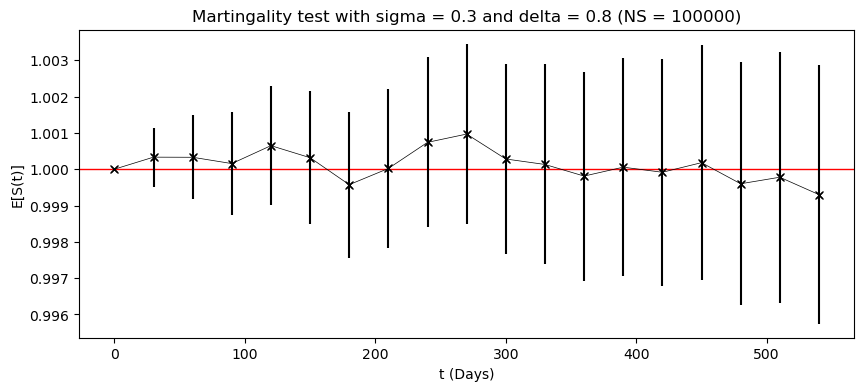



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      0.00e+00        0.00e+00       0.0360 sec.
       30    1.000259      2.59e-04        6.35e-04       0.0059 sec.
       60    1.000262      2.62e-04        9.01e-04       0.0042 sec.
       90    1.000146      1.46e-04        1.11e-03       0.0044 sec.
      120    1.000531      5.31e-04        1.28e-03       0.0041 sec.
      150    1.000256      2.56e-04        1.43e-03       0.0040 sec.
      180    0.999677      3.23e-04        1.57e-03       0.0044 sec.
      210    1.000040      3.98e-05        1.71e-03       0.0041 sec.
      240    1.000613      6.13e-04        1.83e-03       0.0045 sec.
      270    1.000791      7.91e-04        1.95e-03       0.0042 sec.
      300    1.000247      2.47e-04        2.06e-03       0.0042 sec.
      330    1.000111      1.11e-04        2.16e-03       0.0043 sec.
      360    0.999844      1.56e-04        2.26e-03       0.0041 sec.
      390    1.000032

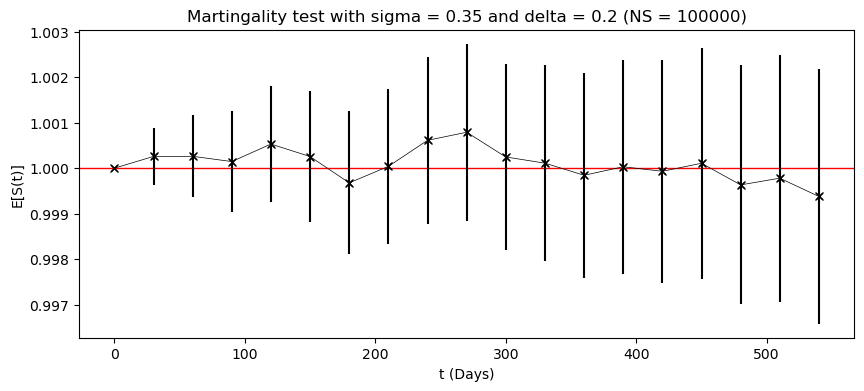



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      1.11e-16        0.00e+00       0.0367 sec.
       30    1.000302      3.02e-04        7.40e-04       0.0059 sec.
       60    1.000305      3.05e-04        1.05e-03       0.0041 sec.
       90    1.000170      1.70e-04        1.29e-03       0.0042 sec.
      120    1.000620      6.20e-04        1.50e-03       0.0044 sec.
      150    1.000299      2.99e-04        1.67e-03       0.0040 sec.
      180    0.999624      3.76e-04        1.84e-03       0.0042 sec.
      210    1.000046      4.65e-05        1.99e-03       0.0041 sec.
      240    1.000715      7.15e-04        2.14e-03       0.0040 sec.
      270    1.000923      9.23e-04        2.27e-03       0.0041 sec.
      300    1.000288      2.88e-04        2.40e-03       0.0040 sec.
      330    1.000130      1.30e-04        2.52e-03       0.0043 sec.
      360    0.999818      1.82e-04        2.63e-03       0.0040 sec.
      390    1.000037

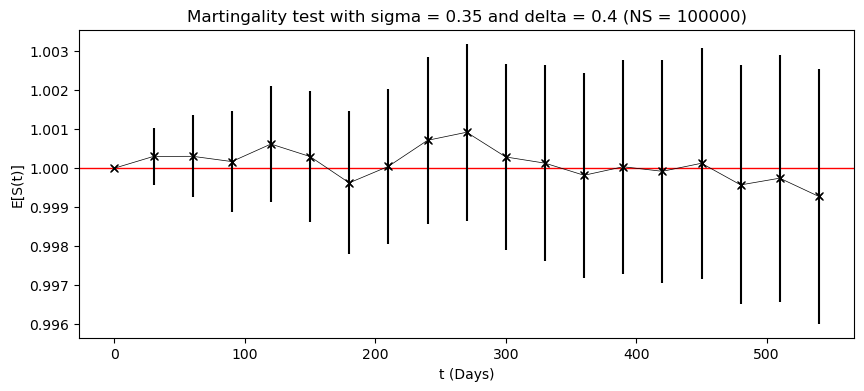



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      0.00e+00        0.00e+00       0.0368 sec.
       30    1.000346      3.46e-04        8.46e-04       0.0060 sec.
       60    1.000349      3.49e-04        1.20e-03       0.0043 sec.
       90    1.000195      1.95e-04        1.48e-03       0.0041 sec.
      120    1.000708      7.08e-04        1.71e-03       0.0041 sec.
      150    1.000341      3.41e-04        1.91e-03       0.0042 sec.
      180    0.999570      4.30e-04        2.10e-03       0.0045 sec.
      210    1.000053      5.31e-05        2.28e-03       0.0042 sec.
      240    1.000818      8.18e-04        2.44e-03       0.0041 sec.
      270    1.001055      1.05e-03        2.60e-03       0.0044 sec.
      300    1.000329      3.29e-04        2.74e-03       0.0041 sec.
      330    1.000148      1.48e-04        2.88e-03       0.0043 sec.
      360    0.999792      2.08e-04        3.01e-03       0.0042 sec.
      390    1.000042

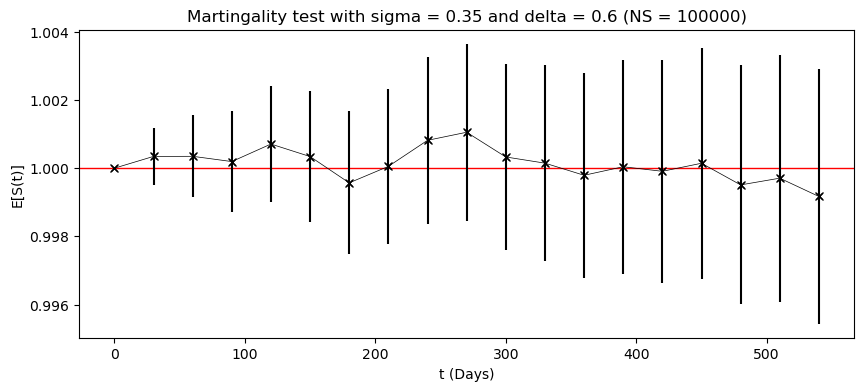



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      0.00e+00        0.00e+00       0.0365 sec.
       30    1.000389      3.89e-04        9.52e-04       0.0065 sec.
       60    1.000392      3.92e-04        1.35e-03       0.0044 sec.
       90    1.000219      2.19e-04        1.66e-03       0.0041 sec.
      120    1.000797      7.97e-04        1.93e-03       0.0040 sec.
      150    1.000384      3.84e-04        2.15e-03       0.0041 sec.
      180    0.999516      4.84e-04        2.36e-03       0.0043 sec.
      210    1.000060      5.98e-05        2.56e-03       0.0041 sec.
      240    1.000920      9.20e-04        2.75e-03       0.0041 sec.
      270    1.001186      1.19e-03        2.92e-03       0.0040 sec.
      300    1.000370      3.70e-04        3.08e-03       0.0043 sec.
      330    1.000167      1.67e-04        3.24e-03       0.0043 sec.
      360    0.999766      2.34e-04        3.39e-03       0.0041 sec.
      390    1.000048

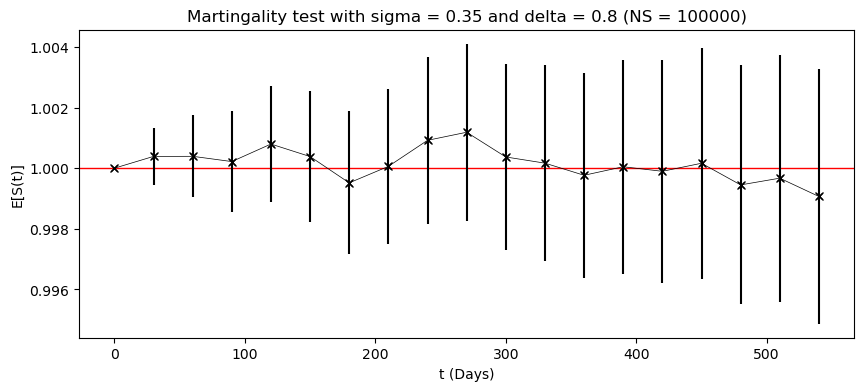



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      0.00e+00        0.00e+00       0.0364 sec.
       30    1.000297      2.97e-04        7.26e-04       0.0064 sec.
       60    1.000305      3.05e-04        1.03e-03       0.0041 sec.
       90    1.000195      1.95e-04        1.27e-03       0.0043 sec.
      120    1.000637      6.37e-04        1.47e-03       0.0041 sec.
      150    1.000303      3.03e-04        1.65e-03       0.0040 sec.
      180    0.999640      3.60e-04        1.81e-03       0.0044 sec.
      210    1.000072      7.15e-05        1.96e-03       0.0041 sec.
      240    1.000742      7.42e-04        2.11e-03       0.0045 sec.
      270    1.000946      9.46e-04        2.24e-03       0.0048 sec.
      300    1.000312      3.12e-04        2.37e-03       0.0046 sec.
      330    1.000133      1.33e-04        2.49e-03       0.0043 sec.
      360    0.999806      1.94e-04        2.60e-03       0.0045 sec.
      390    1.000014

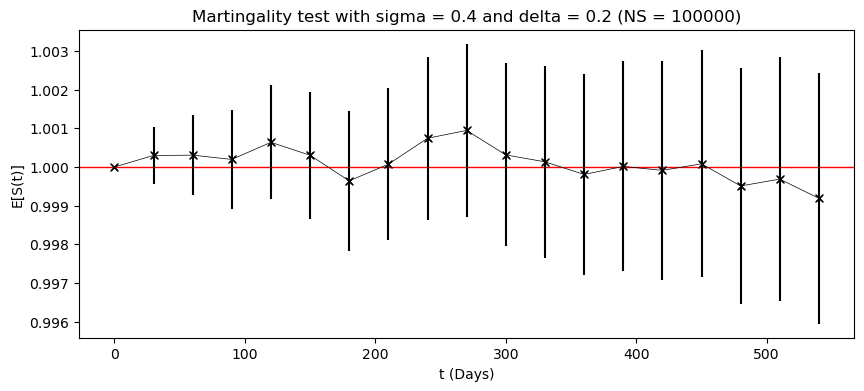



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      1.11e-16        0.00e+00       0.5721 sec.
       30    1.000347      3.47e-04        8.47e-04       0.0782 sec.
       60    1.000356      3.56e-04        1.20e-03       0.0062 sec.
       90    1.000228      2.28e-04        1.48e-03       0.0072 sec.
      120    1.000744      7.44e-04        1.72e-03       0.0140 sec.
      150    1.000354      3.54e-04        1.92e-03       0.0052 sec.
      180    0.999580      4.20e-04        2.11e-03       0.0082 sec.
      210    1.000083      8.34e-05        2.29e-03       0.0068 sec.
      240    1.000866      8.66e-04        2.46e-03       0.0046 sec.
      270    1.001103      1.10e-03        2.62e-03       0.0063 sec.
      300    1.000364      3.64e-04        2.76e-03       0.0097 sec.
      330    1.000155      1.55e-04        2.90e-03       0.0062 sec.
      360    0.999774      2.26e-04        3.04e-03       0.0052 sec.
      390    1.000017

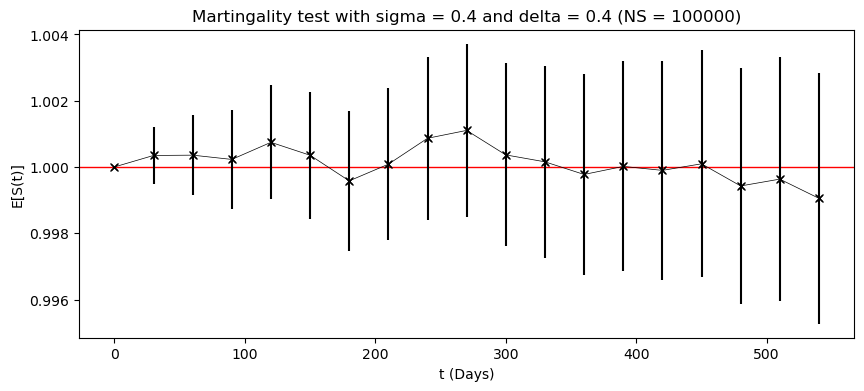



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      0.00e+00        0.00e+00       0.0319 sec.
       30    1.000397      3.97e-04        9.68e-04       0.0057 sec.
       60    1.000407      4.07e-04        1.37e-03       0.0041 sec.
       90    1.000260      2.60e-04        1.69e-03       0.0044 sec.
      120    1.000850      8.50e-04        1.96e-03       0.0047 sec.
      150    1.000404      4.04e-04        2.19e-03       0.0046 sec.
      180    0.999520      4.80e-04        2.41e-03       0.0049 sec.
      210    1.000095      9.53e-05        2.62e-03       0.0044 sec.
      240    1.000989      9.89e-04        2.81e-03       0.0042 sec.
      270    1.001261      1.26e-03        2.99e-03       0.0041 sec.
      300    1.000416      4.16e-04        3.16e-03       0.0042 sec.
      330    1.000177      1.77e-04        3.32e-03       0.0040 sec.
      360    0.999742      2.58e-04        3.47e-03       0.0041 sec.
      390    1.000019

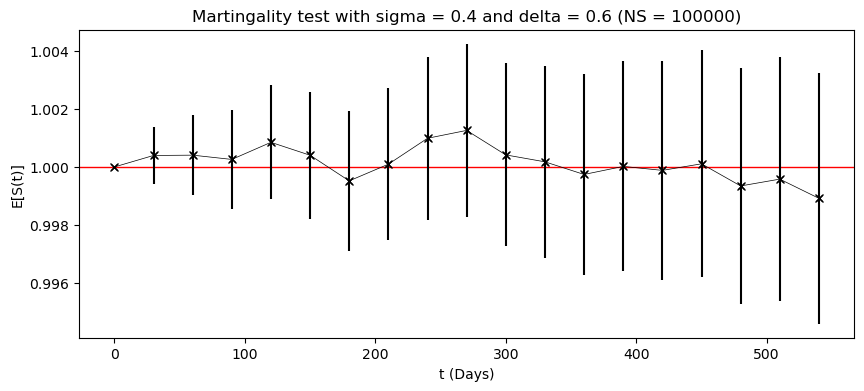



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      0.00e+00        0.00e+00       0.0165 sec.
       30    1.000446      4.46e-04        1.09e-03       0.0046 sec.
       60    1.000458      4.58e-04        1.55e-03       0.0041 sec.
       90    1.000293      2.93e-04        1.91e-03       0.0043 sec.
      120    1.000956      9.56e-04        2.21e-03       0.0045 sec.
      150    1.000455      4.55e-04        2.47e-03       0.0043 sec.
      180    0.999460      5.40e-04        2.71e-03       0.0044 sec.
      210    1.000107      1.07e-04        2.94e-03       0.0043 sec.
      240    1.001113      1.11e-03        3.16e-03       0.0044 sec.
      270    1.001419      1.42e-03        3.36e-03       0.0045 sec.
      300    1.000468      4.68e-04        3.55e-03       0.0043 sec.
      330    1.000199      1.99e-04        3.73e-03       0.0045 sec.
      360    0.999709      2.91e-04        3.91e-03       0.0043 sec.
      390    1.000022

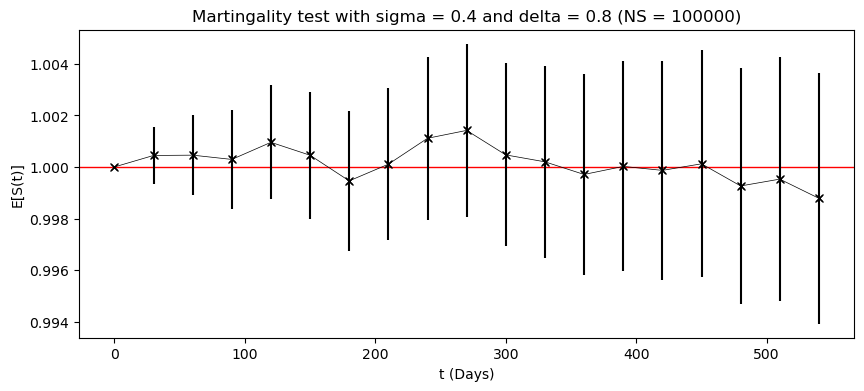



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      0.00e+00        0.00e+00       0.0207 sec.
       30    1.000453      4.53e-04        1.09e-03       0.0051 sec.
       60    1.000495      4.95e-04        1.56e-03       0.0044 sec.
       90    1.000452      4.52e-04        1.93e-03       0.0043 sec.
      120    1.001131      1.13e-03        2.25e-03       0.0042 sec.
      150    1.000508      5.08e-04        2.52e-03       0.0044 sec.
      180    0.999496      5.04e-04        2.78e-03       0.0044 sec.
      210    1.000243      2.43e-04        3.03e-03       0.0043 sec.
      240    1.001337      1.34e-03        3.27e-03       0.0043 sec.
      270    1.001647      1.65e-03        3.50e-03       0.0042 sec.
      300    1.000623      6.23e-04        3.71e-03       0.0045 sec.
      330    1.000178      1.78e-04        3.92e-03       0.0043 sec.
      360    0.999540      4.60e-04        4.11e-03       0.0043 sec.
      390    0.999766

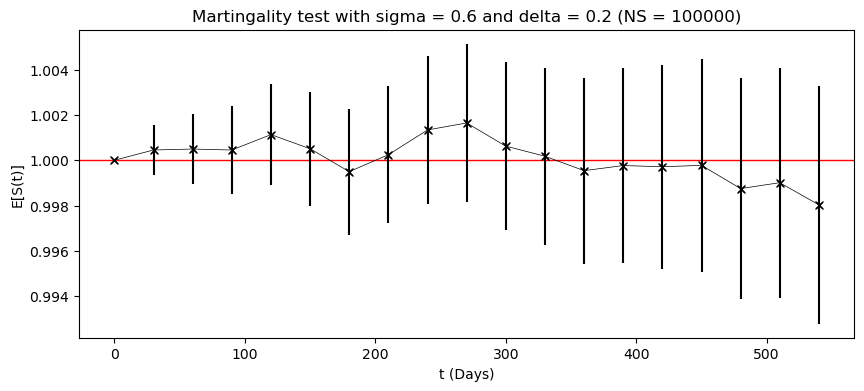



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      1.11e-16        0.00e+00       0.0208 sec.
       30    1.000528      5.28e-04        1.28e-03       0.0052 sec.
       60    1.000577      5.77e-04        1.82e-03       0.0042 sec.
       90    1.000528      5.28e-04        2.25e-03       0.0043 sec.
      120    1.001319      1.32e-03        2.62e-03       0.0042 sec.
      150    1.000593      5.93e-04        2.94e-03       0.0047 sec.
      180    0.999412      5.88e-04        3.24e-03       0.0042 sec.
      210    1.000284      2.84e-04        3.54e-03       0.0043 sec.
      240    1.001560      1.56e-03        3.82e-03       0.0043 sec.
      270    1.001921      1.92e-03        4.08e-03       0.0042 sec.
      300    1.000727      7.27e-04        4.33e-03       0.0045 sec.
      330    1.000207      2.07e-04        4.57e-03       0.0042 sec.
      360    0.999464      5.36e-04        4.80e-03       0.0040 sec.
      390    0.999727

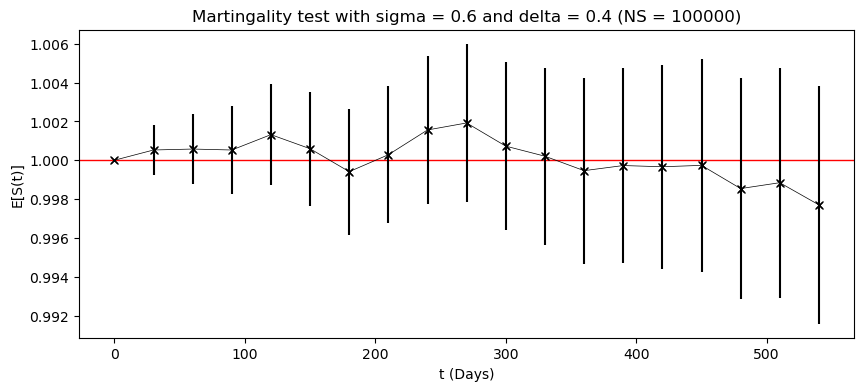



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      0.00e+00        0.00e+00       0.0465 sec.
       30    1.000604      6.04e-04        1.46e-03       0.0098 sec.
       60    1.000660      6.60e-04        2.08e-03       0.0060 sec.
       90    1.000603      6.03e-04        2.57e-03       0.0147 sec.
      120    1.001507      1.51e-03        2.99e-03       0.0056 sec.
      150    1.000678      6.78e-04        3.36e-03       0.0053 sec.
      180    0.999328      6.72e-04        3.71e-03       0.0048 sec.
      210    1.000325      3.25e-04        4.04e-03       0.0066 sec.
      240    1.001783      1.78e-03        4.36e-03       0.0056 sec.
      270    1.002196      2.20e-03        4.66e-03       0.0076 sec.
      300    1.000830      8.30e-04        4.95e-03       0.0051 sec.
      330    1.000237      2.37e-04        5.22e-03       0.0067 sec.
      360    0.999387      6.13e-04        5.48e-03       0.0054 sec.
      390    0.999688

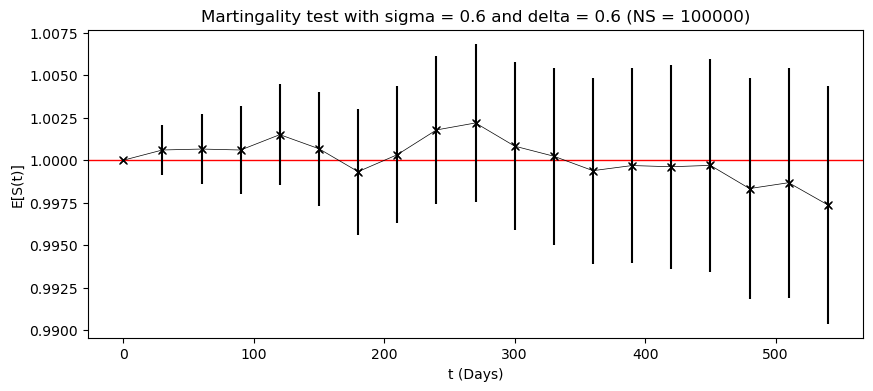



        t     E[S(t)]   |S(0)-E[S(t)]|      MC-err         elapsed
        0    1.000000      0.00e+00        0.00e+00       0.0368 sec.
       30    1.000679      6.79e-04        1.64e-03       0.0064 sec.
       60    1.000742      7.42e-04        2.34e-03       0.0045 sec.
       90    1.000678      6.78e-04        2.89e-03       0.0043 sec.
      120    1.001696      1.70e-03        3.37e-03       0.0043 sec.
      150    1.000763      7.63e-04        3.78e-03       0.0042 sec.
      180    0.999244      7.56e-04        4.17e-03       0.0043 sec.
      210    1.000365      3.65e-04        4.55e-03       0.0045 sec.
      240    1.002006      2.01e-03        4.91e-03       0.0043 sec.
      270    1.002470      2.47e-03        5.25e-03       0.0045 sec.
      300    1.000934      9.34e-04        5.57e-03       0.0043 sec.
      330    1.000267      2.67e-04        5.87e-03       0.0043 sec.
      360    0.999310      6.90e-04        6.17e-03       0.0043 sec.
      390    0.999649

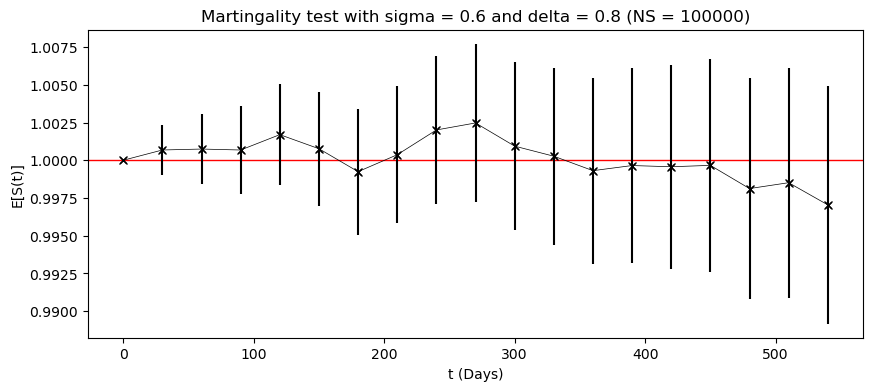

In [5]:
def martingale_property(S_0,Nt,NS,sigma,delta,years):

    T1 = Timer()

    for s in sigma:
        for d in delta:
            
            cout.write("%9s    %8s   %8s    %8s    %12s\n" %("t", "E[S(t)]", "|S(0)-E[S(t)]|", "MC-err", "elapsed"))
            fig, ax = plt.subplots(figsize=(10, 4))
            ax.axhline(y=1, color='red', linestyle='-', linewidth=1)
            E_values = [] 
                
            S_t = S_t_process(S_0,Nt,NS,s,d,years)
            
            for i in [0,30,60,90,120,150,180,210,240,270,300,330,360,390,420,450,480,510,540]:
                T1.start()
            
                E,std = stats(S_t[:, i])
                Err = 1.65 * std / sqrt(NS)
                    
                t1 = T1.stop()
                cout.write("%9s    %8.6f      %8.2e        %8.2e     %8.4f sec.\n" %(i, E, abs(1 - E), Err, t1))
        
                ax.errorbar(i, E, yerr=Err, fmt='x', color='black', markersize=5)  
                E_values.append(E)  
        
            ax.plot([0,30,60,90,120,150,180,210,240,270,300,330,360,390,420,450,480,510,540], E_values, marker='x', color='black', linestyle='-', linewidth=0.5)
                
            ax.set_xlabel('t (Days)')
            ax.set_ylabel('E[S(t)]')
            ax.set_title('Martingality test with sigma = {} and delta = {} (NS = {})'.format(s,d,NS))
            ax.grid(False)
            plt.show()
            print('\n')

martingale_property(S_0,Nt,NS,sigma,delta,Yrs)

In [6]:
def MC_DD(S,K,NS):
    
    prices = np.zeros((6,3))
    j = 0
    
    for i in [30,60,90,180,360,540]: #compute prices only for our six maturities

        payoff_c = np.where(S[:,i]>K, S[:,i]-K, 0)
        price_c,std_c = stats(payoff_c)
        err_c = 1.65 * std_c / sqrt(NS)
        price_p = price_c - 1 + K  #use the put-call parity to compute Put prices
        prices[j,0] = price_p
        prices[j,1] = price_c
        prices[j,2] = err_c
        j += 1 
    
    return prices

In [7]:
def analytic_DD(S_0, K, delta, T, sigma):
    
    prices = np.zeros((6,2))
    j=0
    
    for i in T:
        
        d1 = (log((S_0+delta)/(K+delta)) + 0.5 * sigma**2 * i) / (sigma*sqrt(i))
        d2 = d1 - (sigma) * sqrt(i)
        call = (S_0+delta) * norm.cdf(d1) - (K+delta)* norm.cdf(d2)
        put = -(S_0+delta) * norm.cdf(-d1) + (K+delta)* norm.cdf(-d2)
        prices[j,0] = put
        prices[j,1] = call
        j += 1

    return prices

In [11]:
for s in sigma:
    for d in delta:
        S = S_t_process(S_0, Nt, NS,s, d,Yrs)
        print("Prices computed with delta = {:.2f} and sigma = {:.2f}".format(d, s))
        print("\n%5s    %6s%4s    %7s     %7s        %6s    %7s    %7s" %("So","Strike", "t", "Put_MC","Call_MC", "Err","Put_analytic","Call_analytic"))
        
        for i in range(len(Strikes)):
            dd = MC_DD(S,Strikes[i],NS)
            an = analytic_DD(S_0, Strikes[i], d, t, s)
            for x,y,z in zip(t,dd,an):
                print("%6.3f  %6.3f %6.3f  %7.4f    %7.4f     +/-  %7.1e    %7.4f         %7.4f" %(S_0, Strikes[i], x,y[0],y[1],y[2],z[0],z[1])) 
    
            print('\n')
        print('\n')       
        print("#################################################################################################################################")     
        print('\n')

Prices computed with delta = 0.20 and sigma = 0.20

   So    Strike   t     Put_MC     Call_MC           Err    Put_analytic    Call_analytic
 1.000   0.800  0.083   0.0002     0.2002     +/-  3.6e-04     0.0000          0.2000
 1.000   0.800  0.167   0.0006     0.2006     +/-  5.1e-04     0.0004          0.2004
 1.000   0.800  0.250   0.0016     0.2016     +/-  6.2e-04     0.0015          0.2015
 1.000   0.800  0.500   0.0071     0.2071     +/-  8.3e-04     0.0072          0.2072
 1.000   0.800  1.000   0.0216     0.2216     +/-  1.1e-03     0.0215          0.2215
 1.000   0.800  1.500   0.0351     0.2351     +/-  1.3e-03     0.0354          0.2354


 1.000   0.900  0.083   0.0021     0.1021     +/-  3.4e-04     0.0019          0.1019
 1.000   0.900  0.167   0.0071     0.1071     +/-  4.6e-04     0.0069          0.1069
 1.000   0.900  0.250   0.0125     0.1125     +/-  5.4e-04     0.0122          0.1122
 1.000   0.900  0.500   0.0267     0.1267     +/-  7.2e-04     0.0267          0.1

In [12]:
def BS_Price_Call_Put(r,q,T,K,sigma,So):
    
    prices = np.zeros((6,2))
    j=0
    for i in T:
        F = So * exp((r-q)*i)
        d = (log(K/F) + (sigma**2 * i / 2))/ sigma
        n1 = norm.cdf(d/(sqrt(i)))
        n2 = norm.cdf((d-sigma*i)/(sqrt(i)))
        price_p = exp(-r*i) * (K*n1 - F*n2)
        price_c = price_p + (1-K)
        prices[j,0] = price_p
        prices[j,1] = price_c
        j += 1
    
    return prices

In [13]:
for s in sigma: 
    print("Prices computed using MC Vs prices computed using BS with delta = {:.2f} and sigma = {:.2f}".format(0, s))
    S = S_t_process(S_0, Nt, NS,s, 0,Yrs)
    
    for i in range(len(Strikes)):
    
        print("\n%5s    %6s%4s    %7s     %7s        %6s      %7s    %7s" %("So","Strike", "t", "Put_MC","Call_MC", "Err","Put_BS","Call_BS"))
        dd = MC_DD(S,Strikes[i],NS)
        bs = BS_Price_Call_Put(0,0,t,Strikes[i],s,S_0)
        
        for x,y,z in zip(t,dd,bs):
            print("%6.3f  %6.3f %6.3f  %7.4f    %7.4f     +/-  %7.1e    %7.4f    %7.4f" %(S_0, Strikes[i], x,y[0],y[1],y[2],z[0],z[1])) 
    print('\n')       
    print("#################################################################################################################################")     
    print('\n')

Prices computed using MC Vs prices computed using BS with delta = 0.00 and sigma = 0.20

   So    Strike   t     Put_MC     Call_MC           Err       Put_BS    Call_BS
 1.000   0.800  0.083   0.0001     0.2001     +/-  3.0e-04     0.0000     0.2000
 1.000   0.800  0.167   0.0002     0.2002     +/-  4.3e-04     0.0001     0.2001
 1.000   0.800  0.250   0.0004     0.2004     +/-  5.2e-04     0.0004     0.2004
 1.000   0.800  0.500   0.0030     0.2030     +/-  7.1e-04     0.0031     0.2031
 1.000   0.800  1.000   0.0120     0.2120     +/-  9.7e-04     0.0119     0.2119
 1.000   0.800  1.500   0.0212     0.2212     +/-  1.2e-03     0.0215     0.2215

   So    Strike   t     Put_MC     Call_MC           Err       Put_BS    Call_BS
 1.000   0.900  0.083   0.0009     0.1009     +/-  2.9e-04     0.0007     0.1007
 1.000   0.900  0.167   0.0038     0.1038     +/-  4.0e-04     0.0036     0.1036
 1.000   0.900  0.250   0.0073     0.1073     +/-  4.7e-04     0.0071     0.1071
 1.000   0.900  0.5

Implied volatilities with delta = 0.20 and sigma = 0.20


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.309813  0.246403  0.242194  0.241537  0.240991  0.240527  0.238781   0.23394
2M   0.256295  0.244455  0.242487  0.241708  0.241059  0.240275  0.238155  0.236778
3M   0.247575  0.244475  0.242962   0.24222  0.241468  0.240767  0.238919  0.237352
6M   0.244065  0.242279  0.241218  0.240598  0.239944  0.239305  0.237702  0.236145
1Y   0.245714  0.242781  0.241378  0.240695  0.240057  0.239446  0.237709  0.235843
18M  0.244319  0.241967  0.240822   0.24027  0.239736  0.239239  0.237878  0.236044




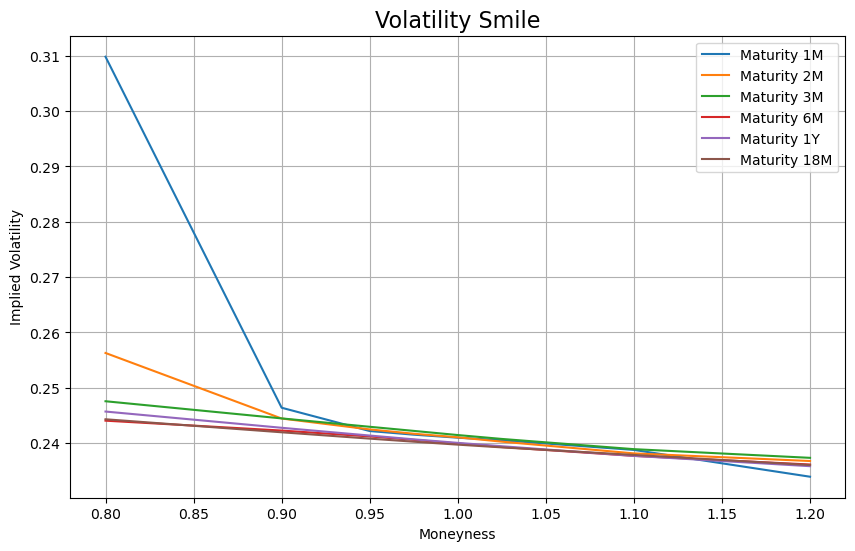

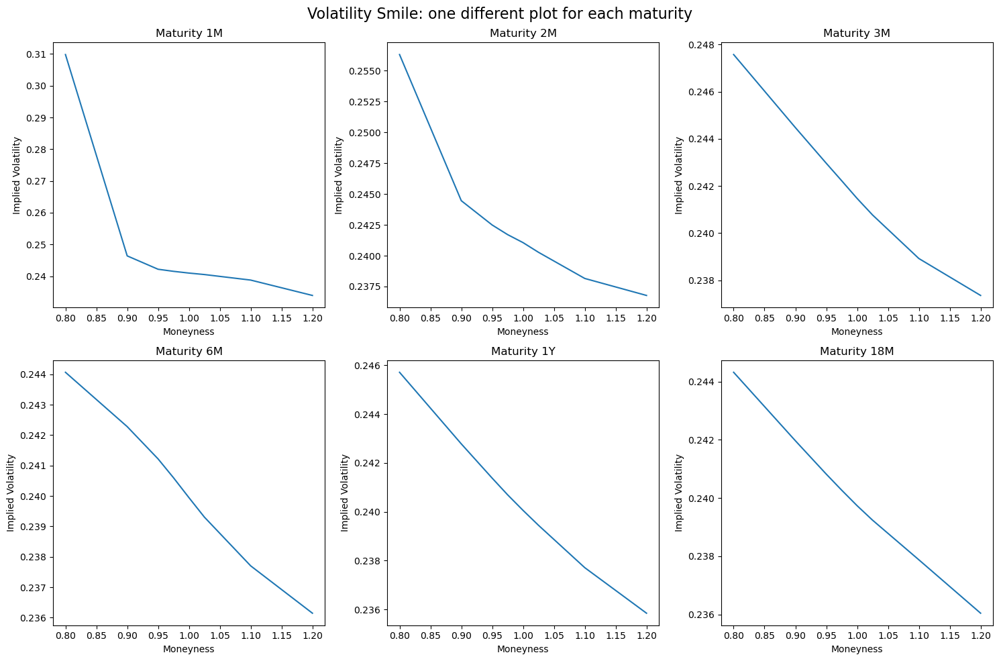

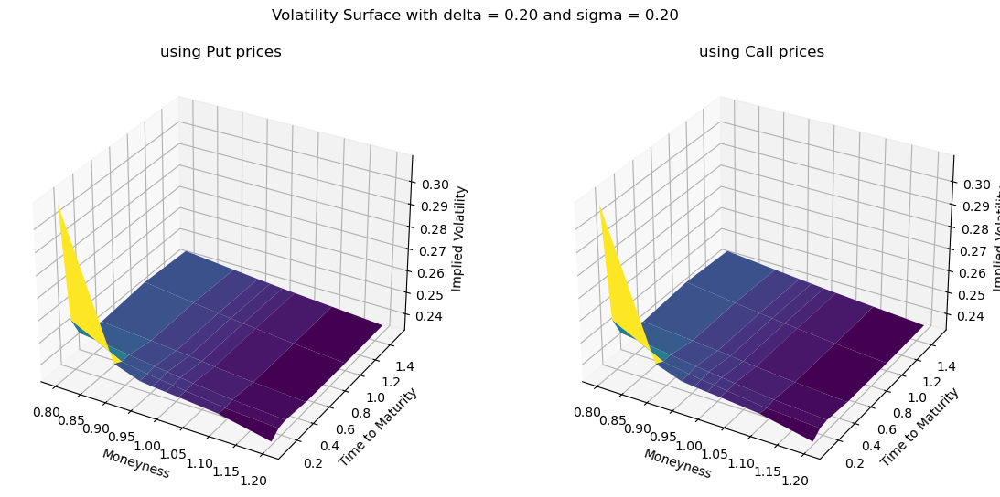







Implied volatilities with delta = 0.40 and sigma = 0.20


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.327485  0.287837  0.283391  0.282231  0.281176  0.280277  0.277205   0.27114
2M    0.29707  0.286725  0.283741  0.282438  0.281276  0.280007  0.276427  0.273203
3M   0.292472  0.286976  0.284355  0.283038  0.281775  0.280585  0.277317    0.2739
6M   0.289242  0.284672  0.282396  0.281226  0.280057  0.278925  0.275874  0.272751
1Y   0.290817  0.285249  0.282678  0.281458  0.280311  0.279202  0.276082  0.272552
18M  0.289537  0.284504  0.282195  0.281108  0.280058  0.279061   0.27634  0.272859




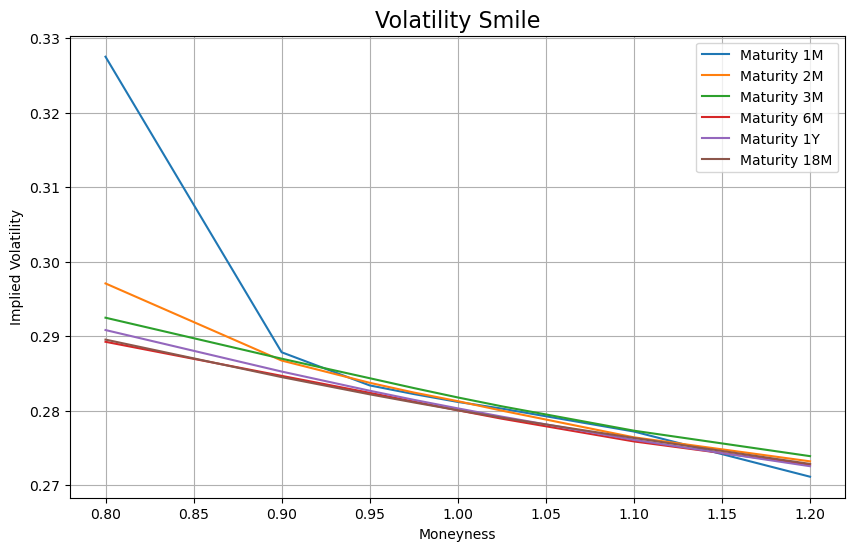

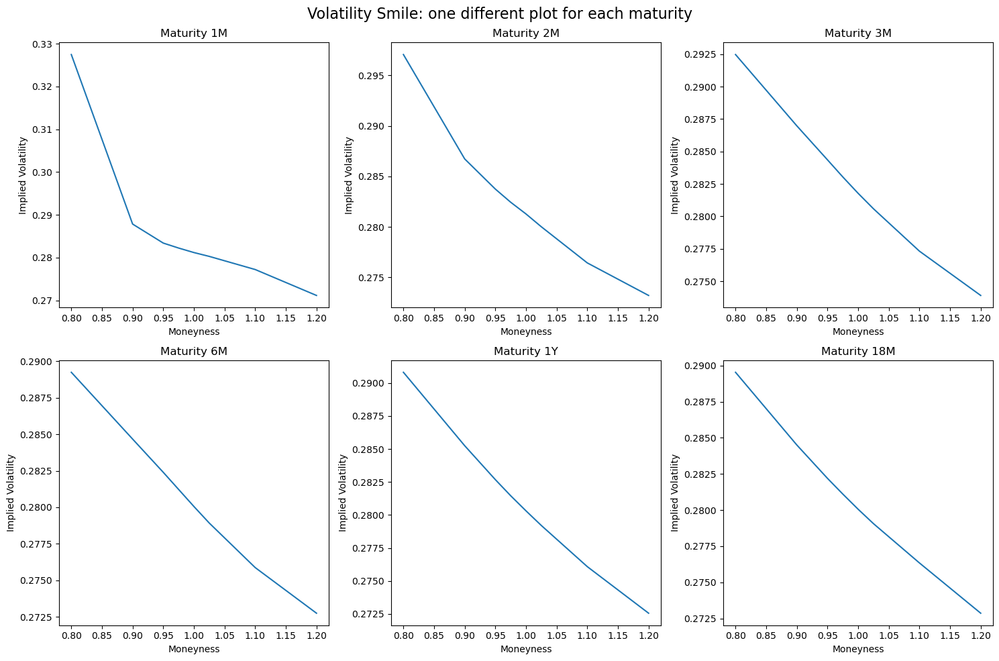

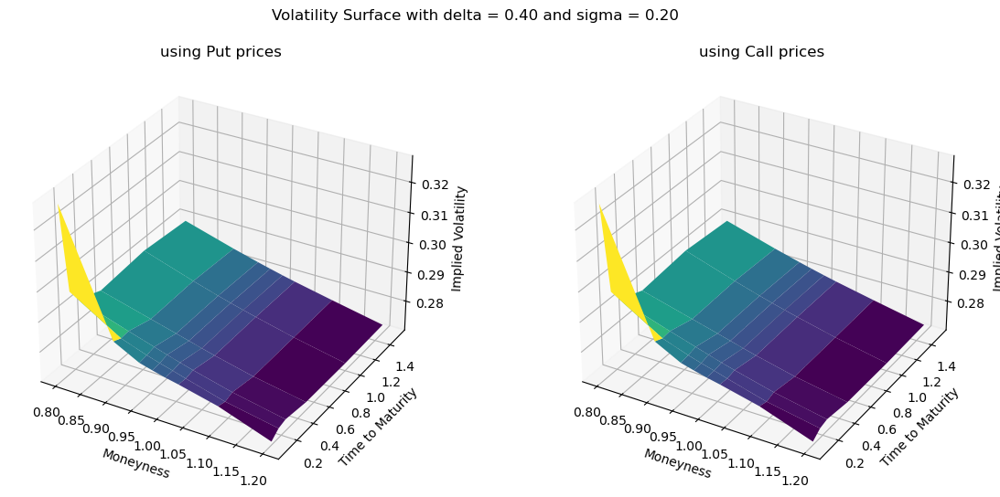







Implied volatilities with delta = 0.60 and sigma = 0.20


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.356789  0.329397  0.324607   0.32292  0.321371  0.320008  0.315518  0.308182
2M    0.34014  0.329058  0.324991  0.323187  0.321513  0.319758   0.31475  0.309843
3M   0.337608  0.329479   0.32576  0.323886   0.32211  0.320431  0.315761  0.310551
6M    0.33433  0.327099  0.323624  0.321911  0.320225  0.318598   0.31412  0.309373
1Y   0.336068  0.327827    0.3241  0.322339  0.320678  0.319069  0.314559  0.309334
18M  0.334923  0.327233  0.323753  0.322122  0.320551  0.319047  0.314934  0.309815




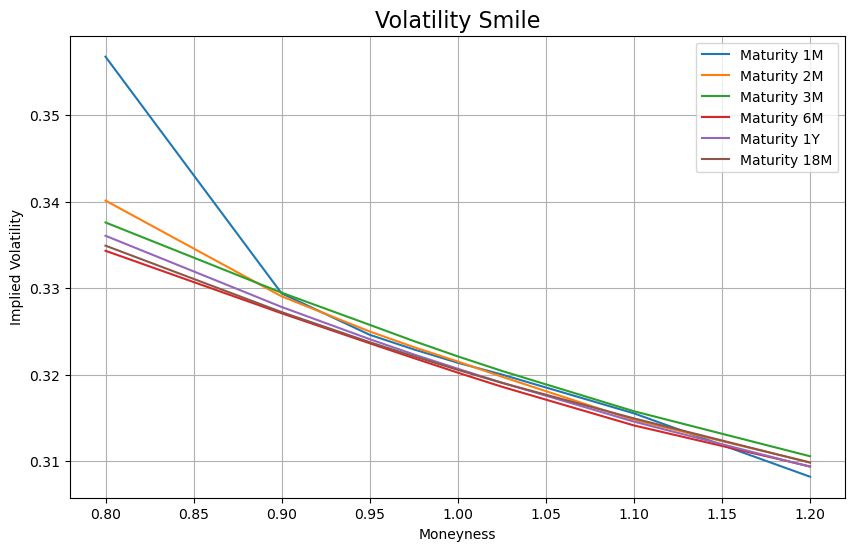

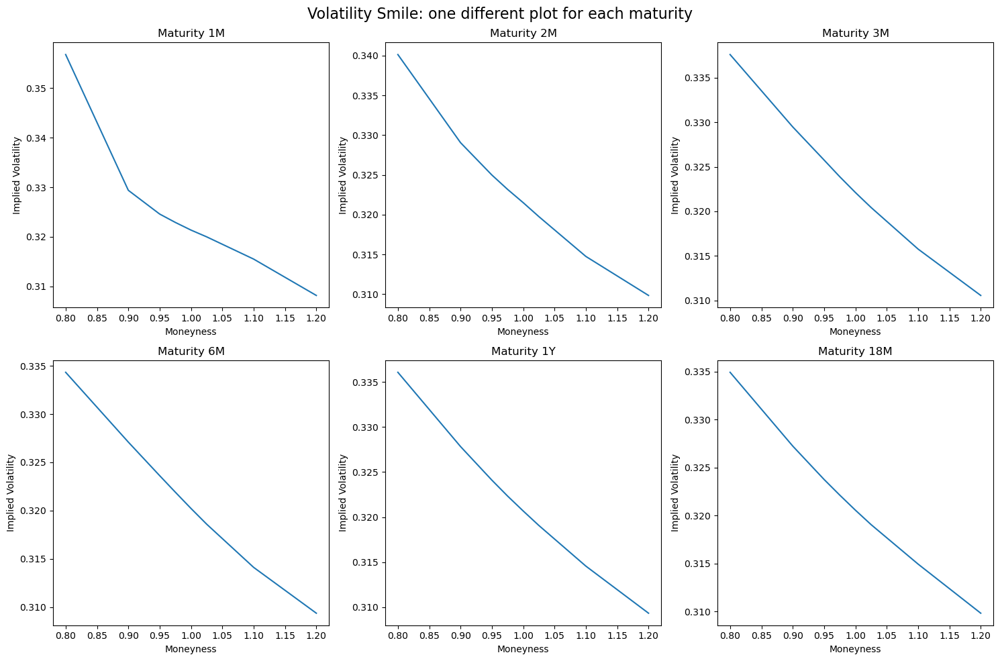

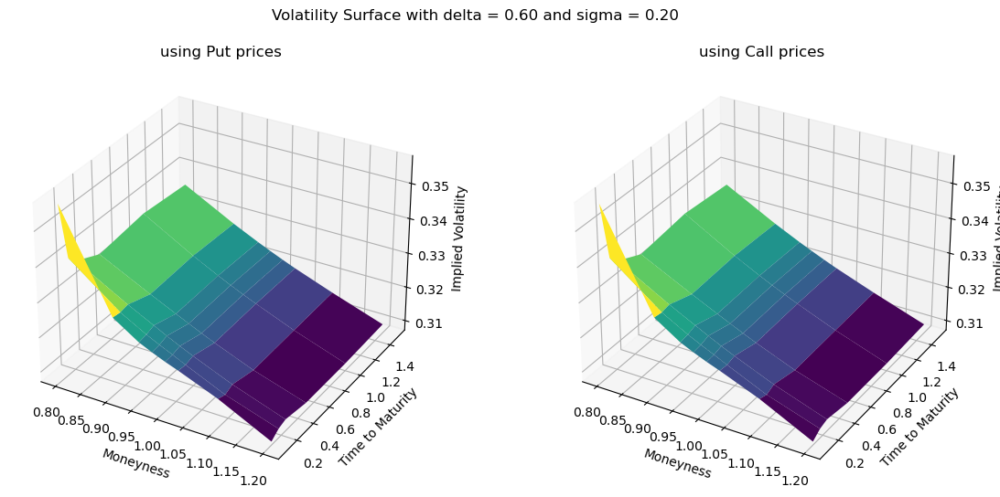







Implied volatilities with delta = 0.80 and sigma = 0.20


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.394724  0.371163  0.365858  0.363606  0.361577  0.359735  0.353852  0.345389
2M   0.384212  0.371412   0.36627  0.363959  0.361771  0.359531  0.353114   0.34637
3M   0.382952  0.372046  0.367183  0.364772  0.362478  0.360308  0.354211  0.347317
6M   0.379498  0.369563  0.364917  0.362661  0.360459  0.358333  0.352426   0.34599
1Y   0.381438  0.370555  0.365661  0.363356  0.361176  0.359064  0.353153  0.346204
18M  0.380532   0.37017  0.365522   0.36334  0.361242  0.359227   0.35369  0.346924




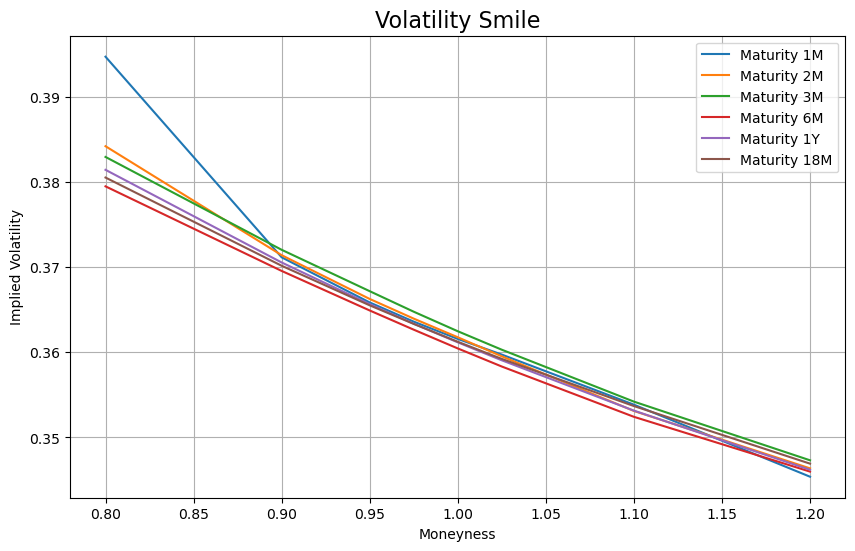

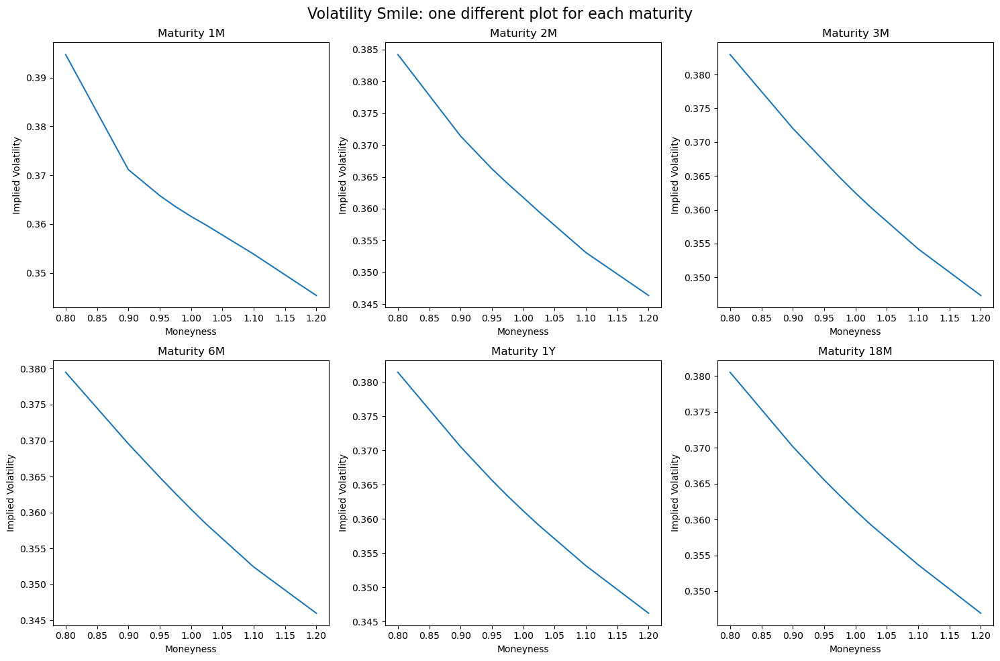

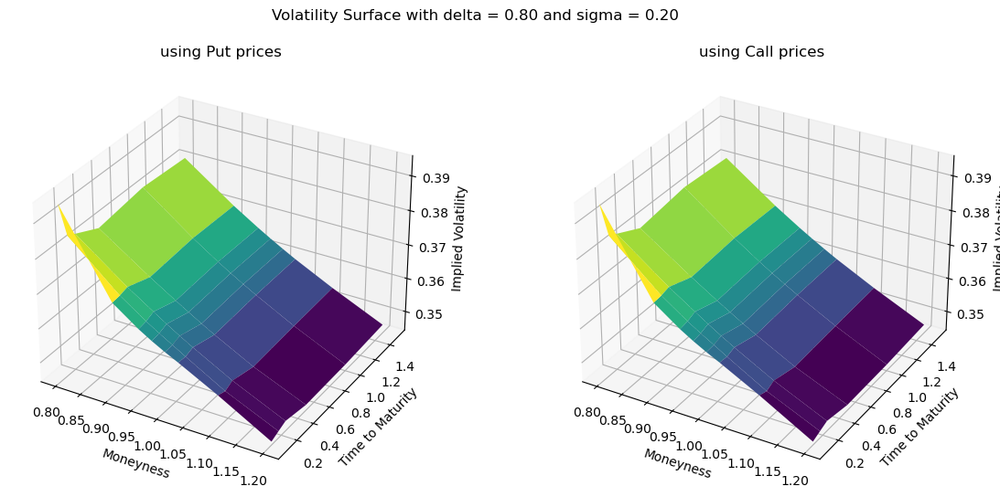







Implied volatilities with delta = 0.20 and sigma = 0.30


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.384864  0.365789  0.363245  0.362296  0.361555  0.360932  0.358474  0.354172
2M   0.372752  0.365925  0.363566  0.362581  0.361642   0.36062  0.357654  0.355007
3M   0.371338  0.366556  0.364445  0.363347  0.362328  0.361379  0.358742  0.355941
6M   0.367217  0.363678  0.361828  0.360891  0.359965  0.359089  0.356682  0.354377
1Y   0.368506  0.364047  0.362011  0.361083  0.360191  0.359329  0.356906  0.354145
18M  0.367036  0.363174   0.36143   0.36061  0.359831  0.359104  0.357085  0.354423




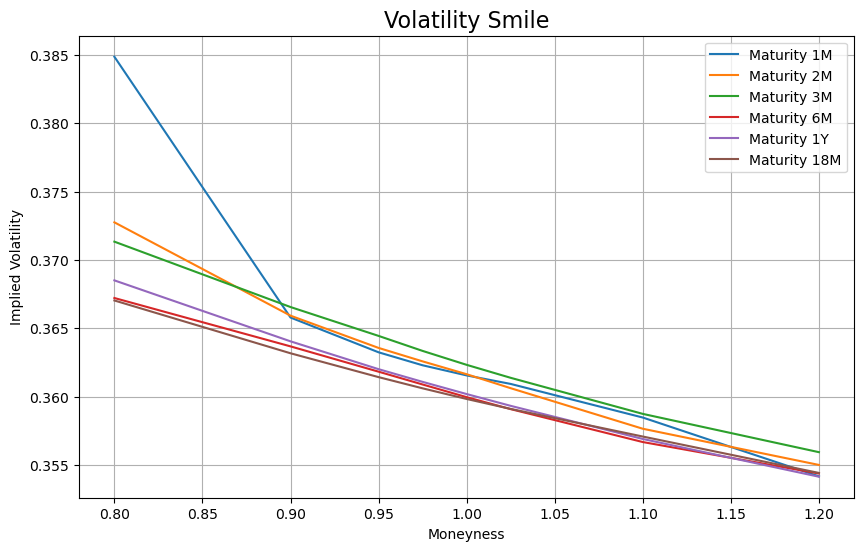

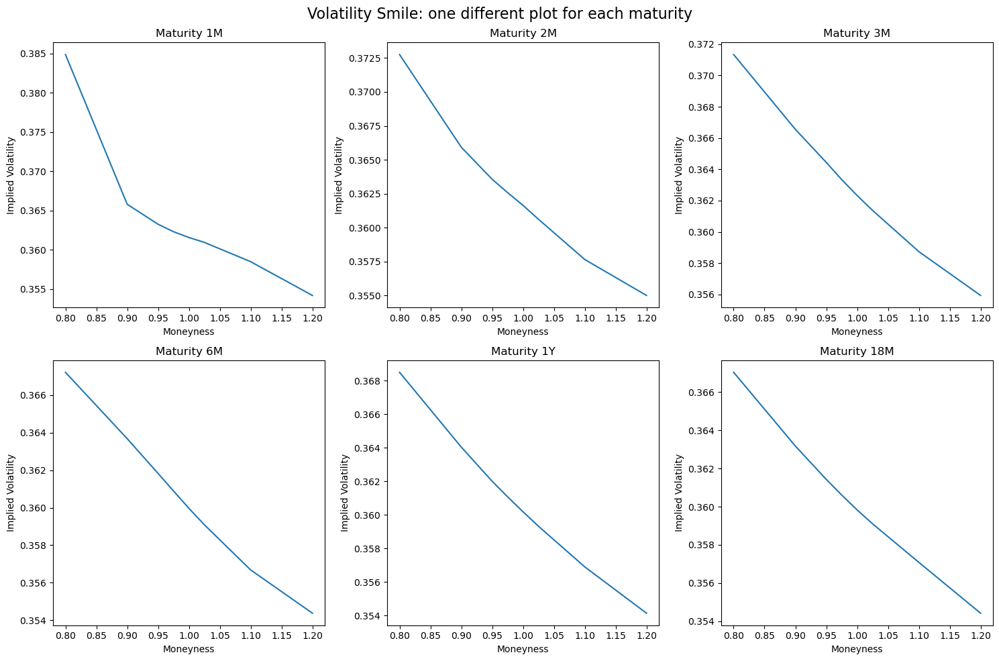

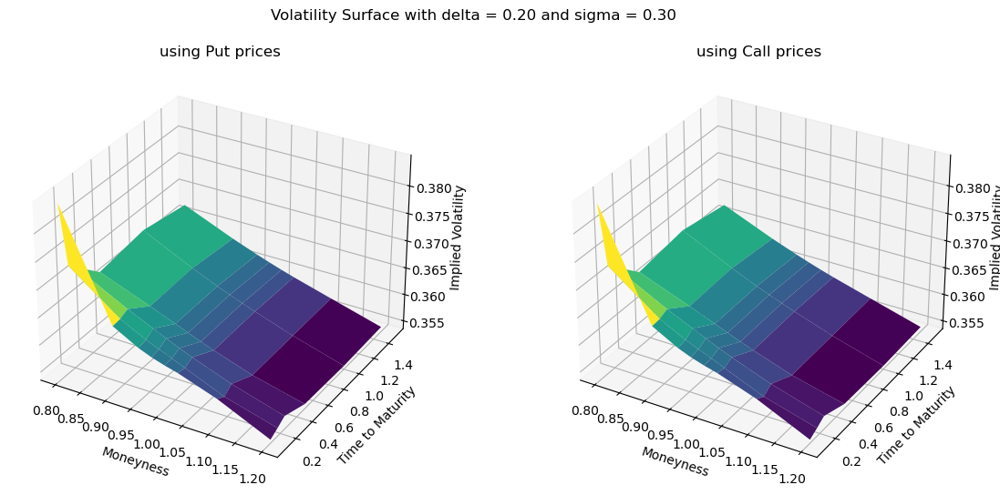







Implied volatilities with delta = 0.40 and sigma = 0.30


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.446618   0.42895  0.425116  0.423362  0.421883  0.420536  0.415896  0.410062
2M   0.439643  0.429511  0.425535  0.423787  0.422055  0.420303  0.415265  0.409806
3M   0.439324  0.430472  0.426601  0.424711  0.422925  0.421239  0.416468  0.411179
6M   0.435022  0.427421  0.423823  0.422075   0.42037   0.41875  0.414213  0.409382
1Y   0.436693  0.428222   0.42446  0.422729  0.421052  0.419439  0.414916  0.409622
18M  0.435672  0.427751  0.424261  0.422619  0.421049  0.419563  0.415436  0.410307




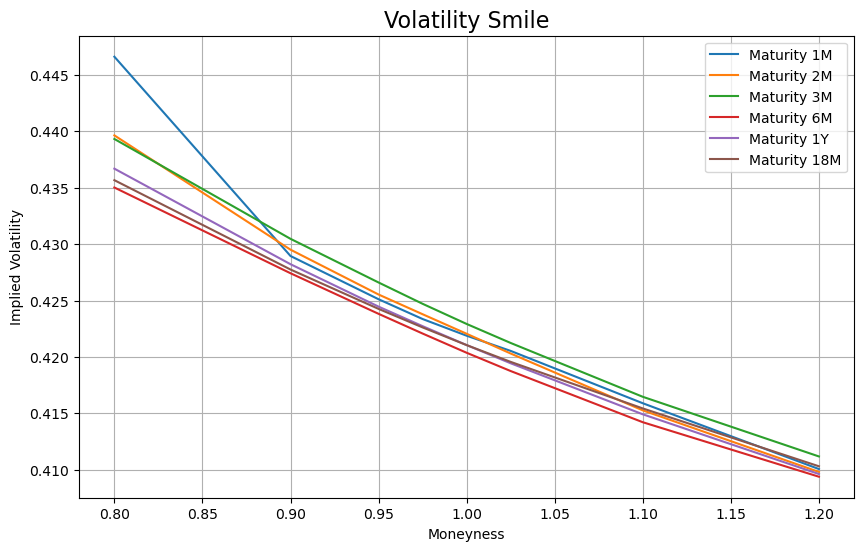

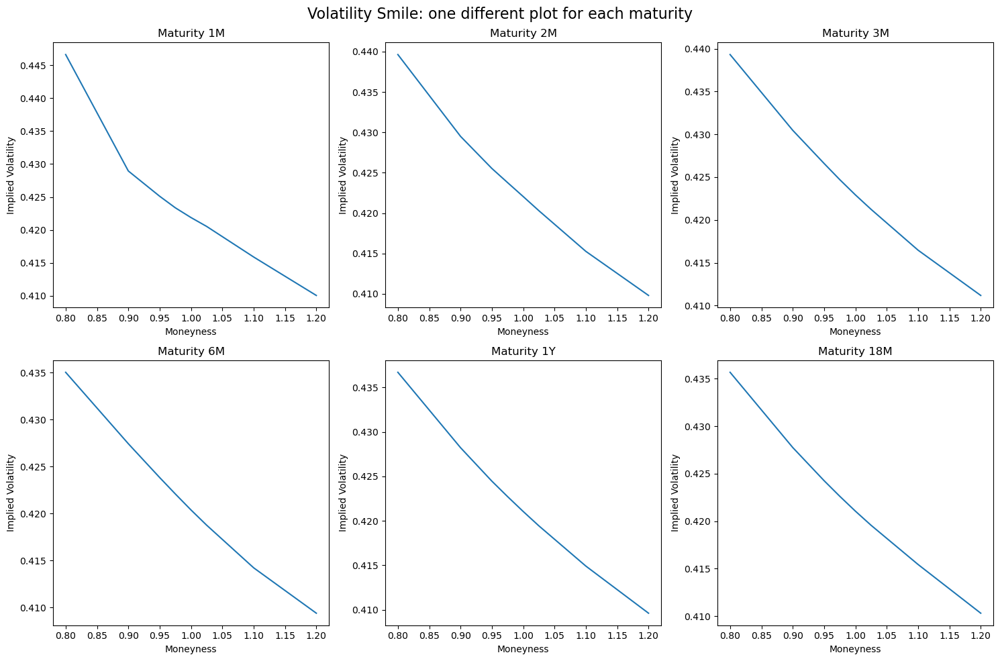

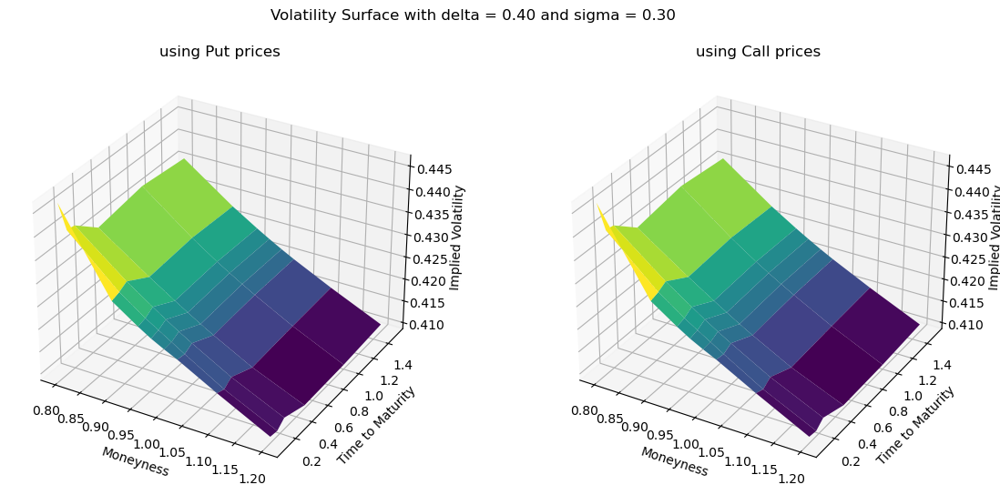







Implied volatilities with delta = 0.60 and sigma = 0.30


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.511111  0.492438  0.487038  0.484467  0.482243  0.480158  0.473365  0.465818
2M   0.506863  0.493233  0.487576   0.48506  0.482531  0.480044  0.472949  0.464759
3M   0.507254  0.494532  0.488871  0.486171   0.48362  0.481192  0.474298  0.466455
6M   0.502985   0.49137  0.486014  0.483455  0.480969  0.478599  0.471936  0.464537
1Y   0.505341  0.492842  0.487331  0.484777  0.482306  0.479928  0.473277  0.465407
18M  0.505018  0.493005  0.487727  0.485245  0.482866  0.480602  0.474301  0.466698




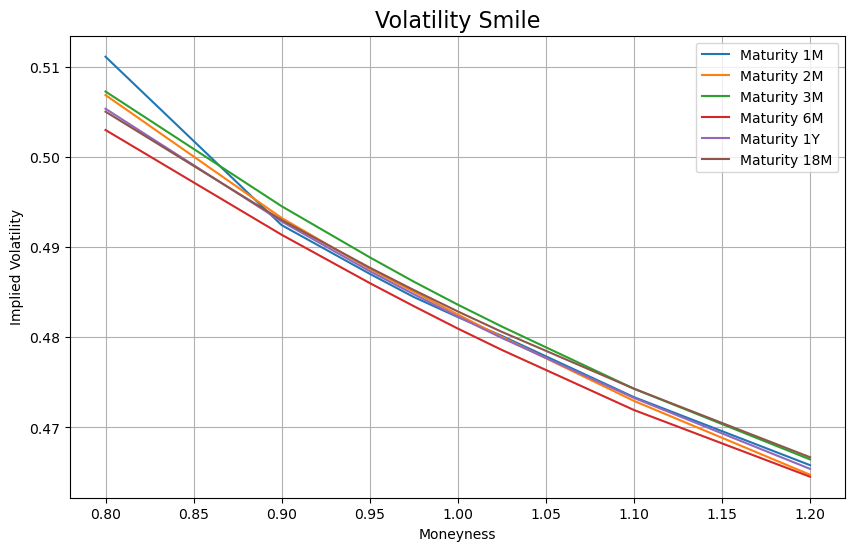

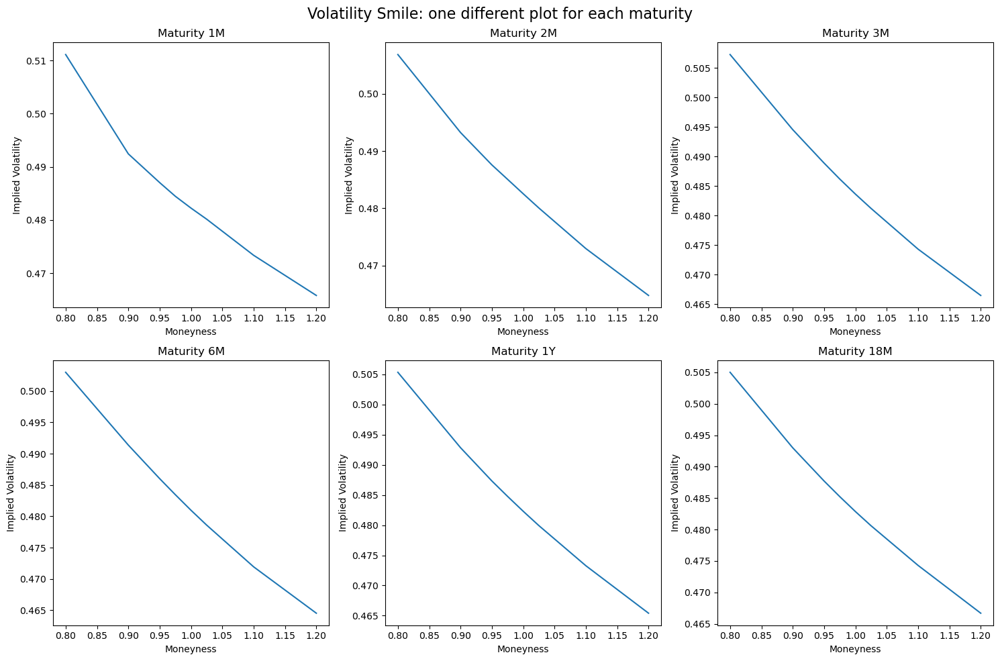

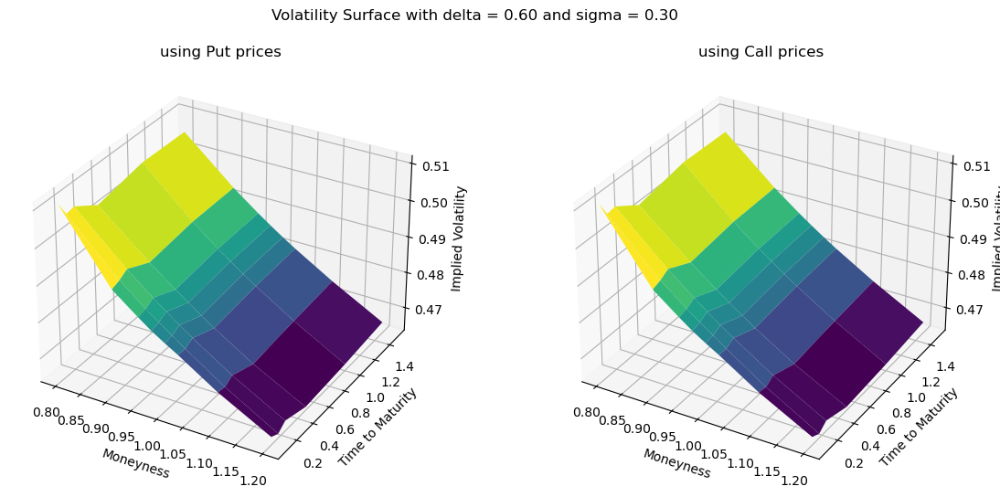







Implied volatilities with delta = 0.80 and sigma = 0.30


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.576868   0.55604  0.548994  0.545618   0.54264  0.539807  0.530918  0.521091
2M   0.574286  0.557048  0.549708  0.546402  0.543082   0.53985  0.530709  0.519858
3M   0.575237  0.558695  0.551261  0.547752  0.544426  0.541248   0.53222  0.521822
6M   0.571224  0.555542   0.54844  0.545063  0.541788  0.538662  0.529865  0.519861
1Y   0.574544  0.557976  0.550693  0.547296  0.544015  0.540859  0.532024  0.521569
18M  0.575261   0.55905  0.551935  0.548591  0.545382   0.54232  0.533785  0.523602




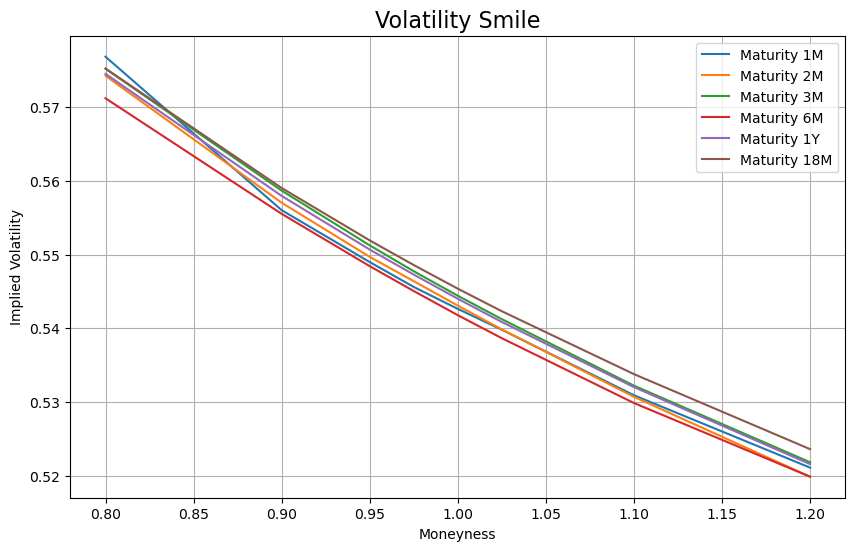

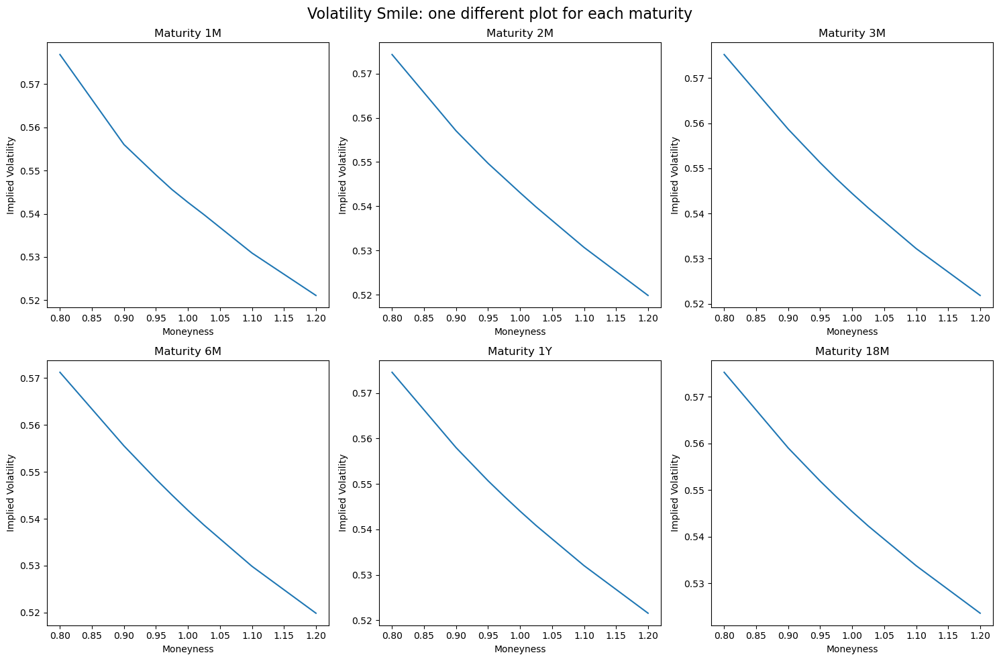

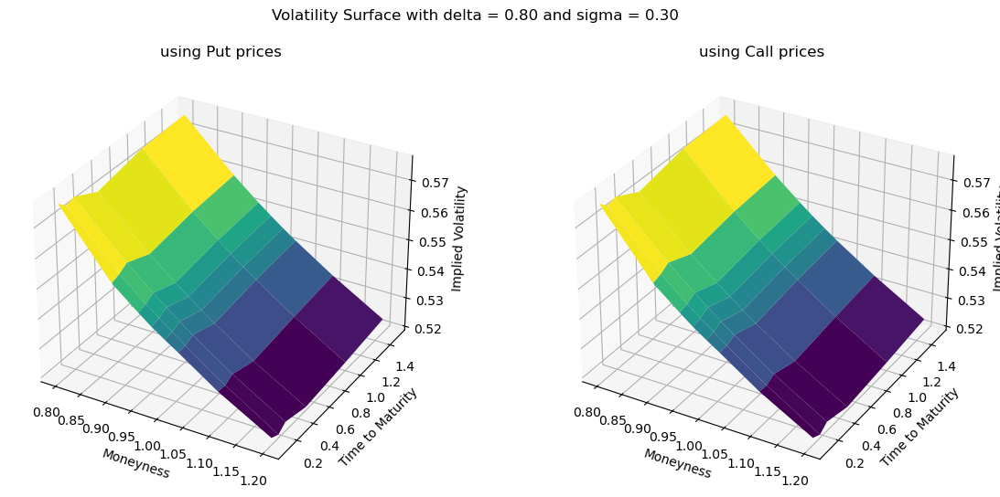







Implied volatilities with delta = 0.20 and sigma = 0.35


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.441184  0.426232   0.42379  0.422696  0.421859  0.421121   0.41819  0.414411
2M   0.433761  0.426723  0.424145  0.423072  0.421957  0.420814  0.417491  0.414077
3M   0.433408  0.427672  0.425178  0.423946  0.422804  0.421727  0.418684  0.415429
6M   0.428726  0.424352   0.42216  0.421081  0.420021  0.419022  0.416239  0.413461
1Y   0.429916  0.424721  0.422415  0.421362  0.420334  0.419348  0.416575   0.41338
18M   0.42848   0.42389  0.421859  0.420906  0.420017   0.41916  0.416795  0.413716




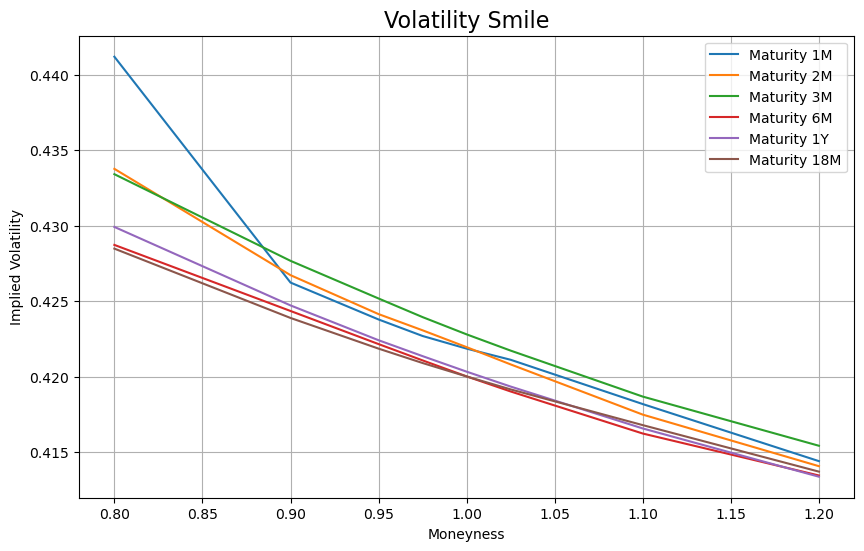

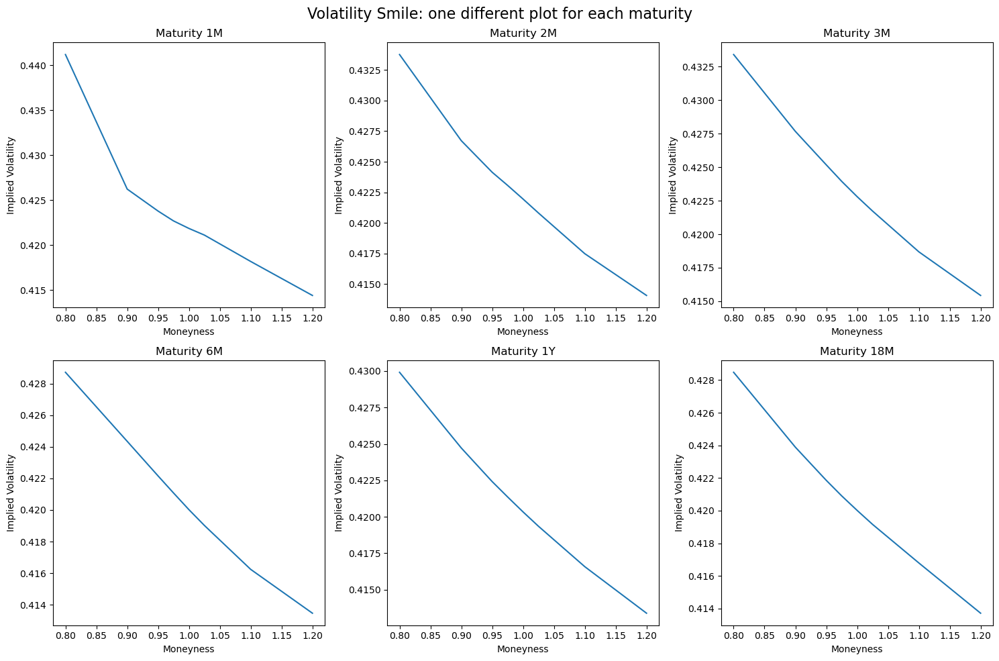

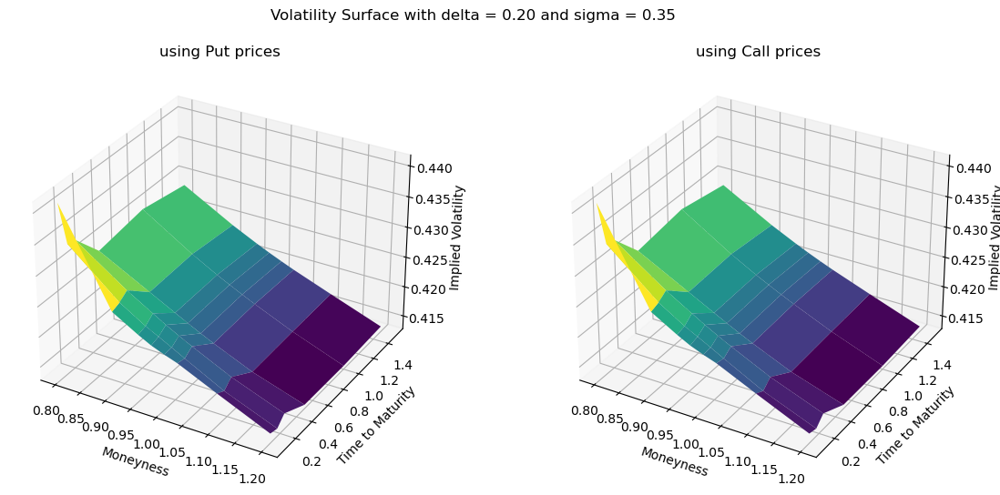







Implied volatilities with delta = 0.40 and sigma = 0.35


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.516343  0.500324  0.496037  0.493987  0.492279  0.490685  0.485247  0.479415
2M   0.512185  0.501065  0.496527  0.494545  0.492504  0.490506   0.48479  0.478216
3M   0.512646    0.5024  0.497817  0.495645  0.493604  0.491666  0.486151  0.479942
6M   0.508021  0.498908  0.494674  0.492648   0.49068  0.488809   0.48355  0.477823
1Y   0.509916  0.500014   0.49568  0.493663  0.491713  0.489839  0.484602  0.478429
18M  0.509232  0.499864  0.495757  0.493835  0.492014  0.490258  0.485403  0.479425




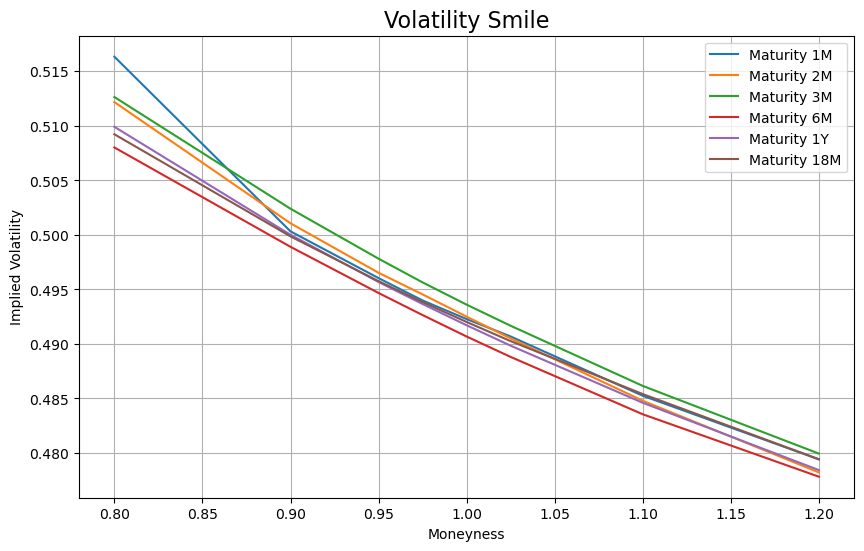

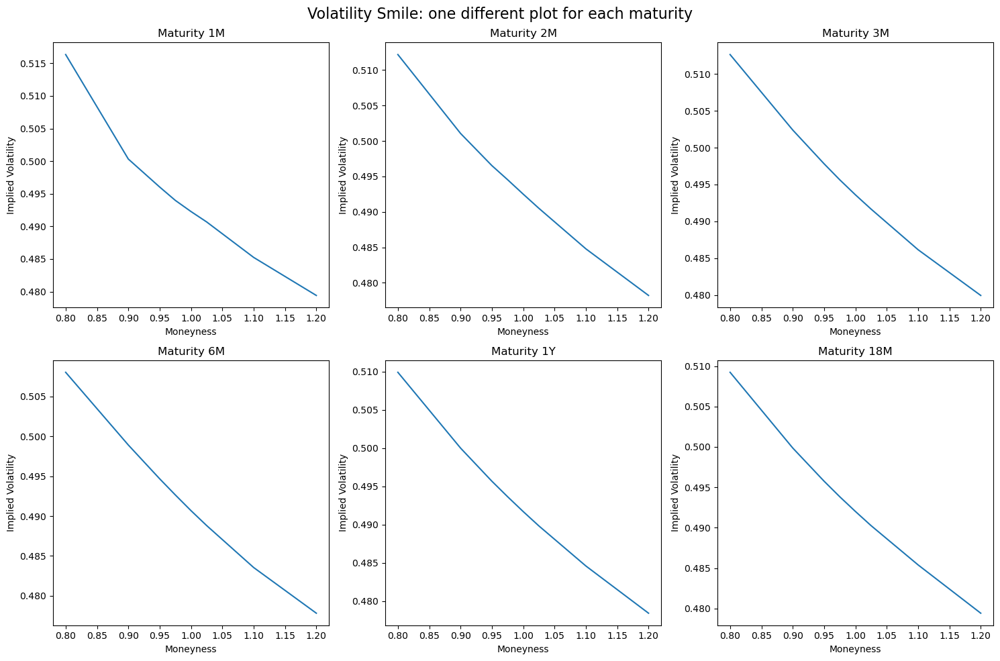

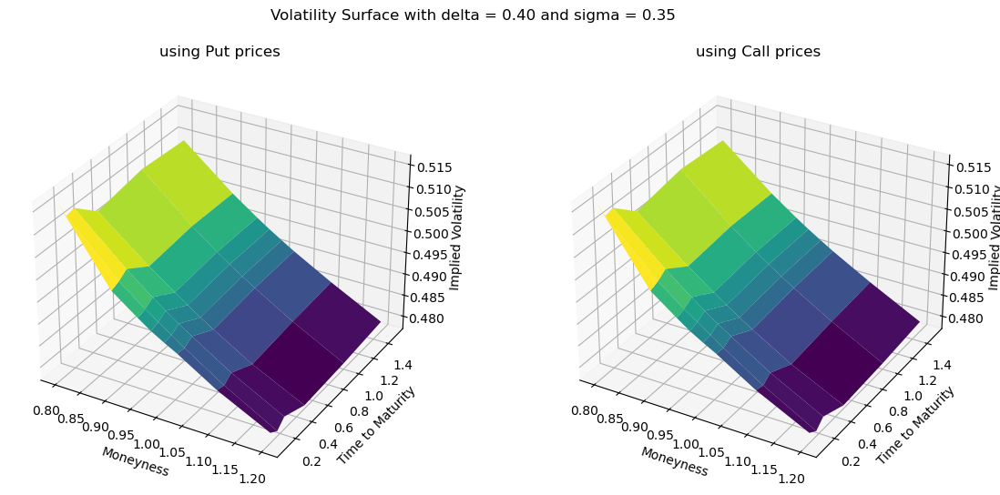







Implied volatilities with delta = 0.60 and sigma = 0.35


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.593186  0.574534  0.568313  0.565339  0.562749  0.560283  0.552412  0.543822
2M   0.590901  0.575515  0.569022  0.566111  0.563152  0.560288  0.552186  0.542557
3M   0.591964  0.577259  0.570629  0.567508  0.564559  0.561751  0.553749  0.544595
6M   0.587647  0.573787  0.567509   0.56453  0.561646  0.558894  0.551152  0.542412
1Y   0.590671  0.576008  0.569613  0.566614  0.563723  0.560944  0.553188  0.544005
18M  0.591158  0.576918  0.570688  0.567763   0.56498  0.562297  0.554857  0.545914




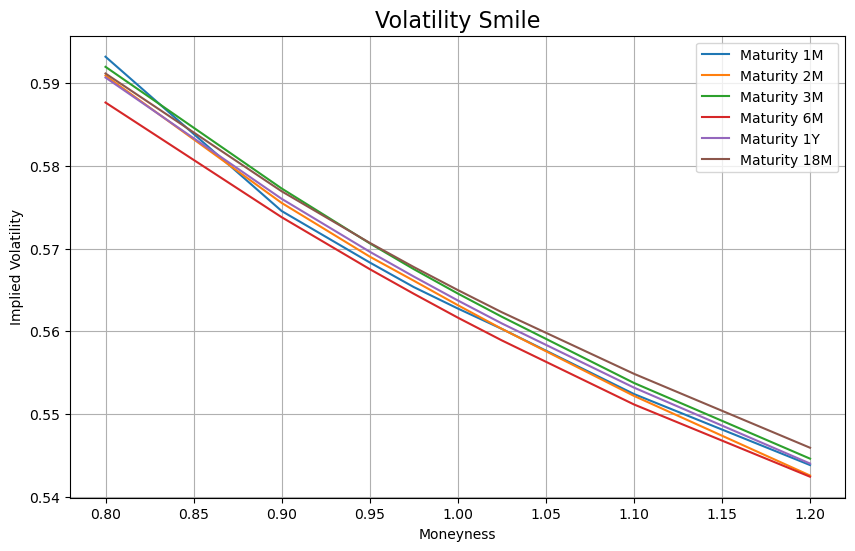

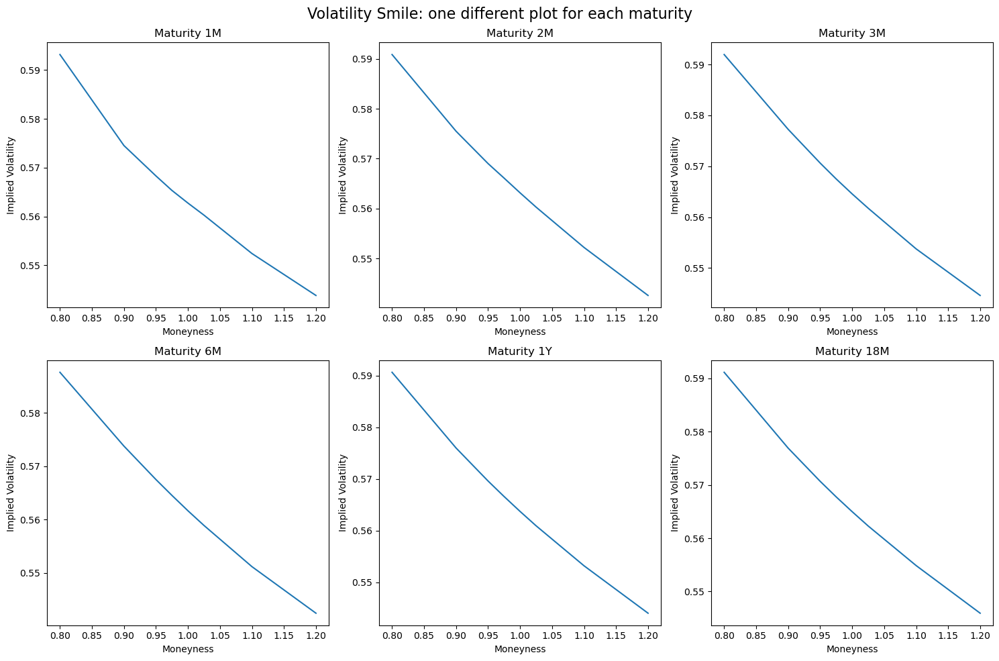

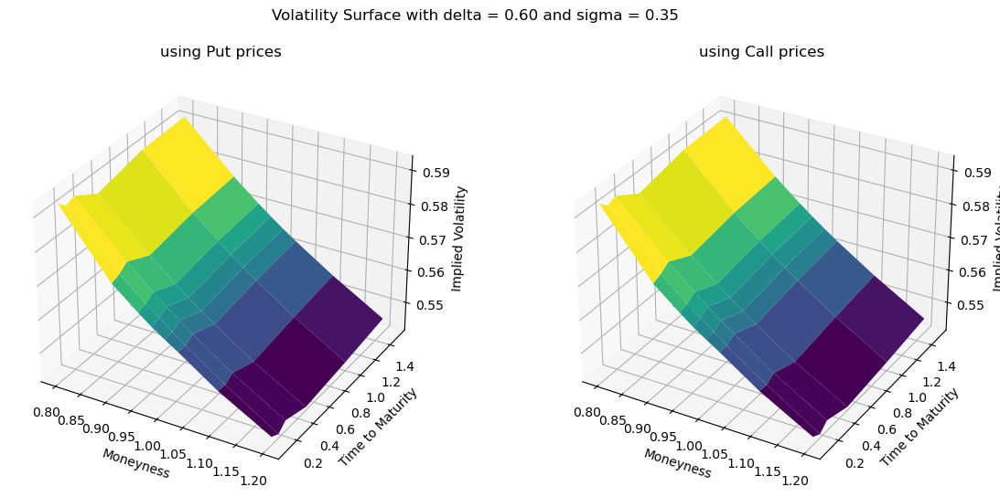







Implied volatilities with delta = 0.80 and sigma = 0.35


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.670357  0.648827  0.640626  0.636765  0.633278  0.629944  0.619671  0.608141
2M   0.669836  0.650057  0.641644  0.637791  0.633919  0.630184  0.619646  0.607032
3M   0.671486  0.652279  0.643623  0.639555  0.635692  0.632004  0.621512  0.609449
6M   0.667648  0.649058  0.640721  0.636778  0.632968  0.629324   0.61908  0.607301
1Y   0.672341  0.652829  0.644329  0.640327  0.636472  0.632768   0.62241  0.610156
18M  0.674533  0.655273  0.646837  0.642874  0.639093  0.635448  0.625322  0.613258




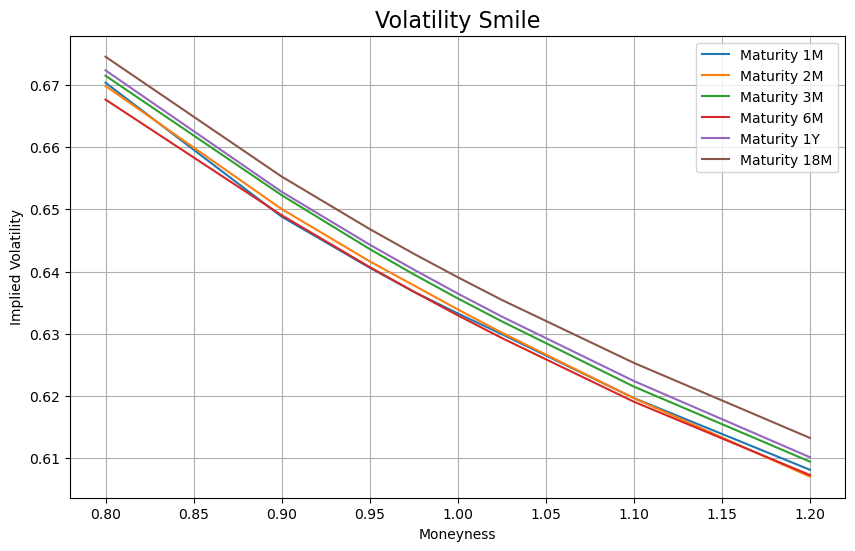

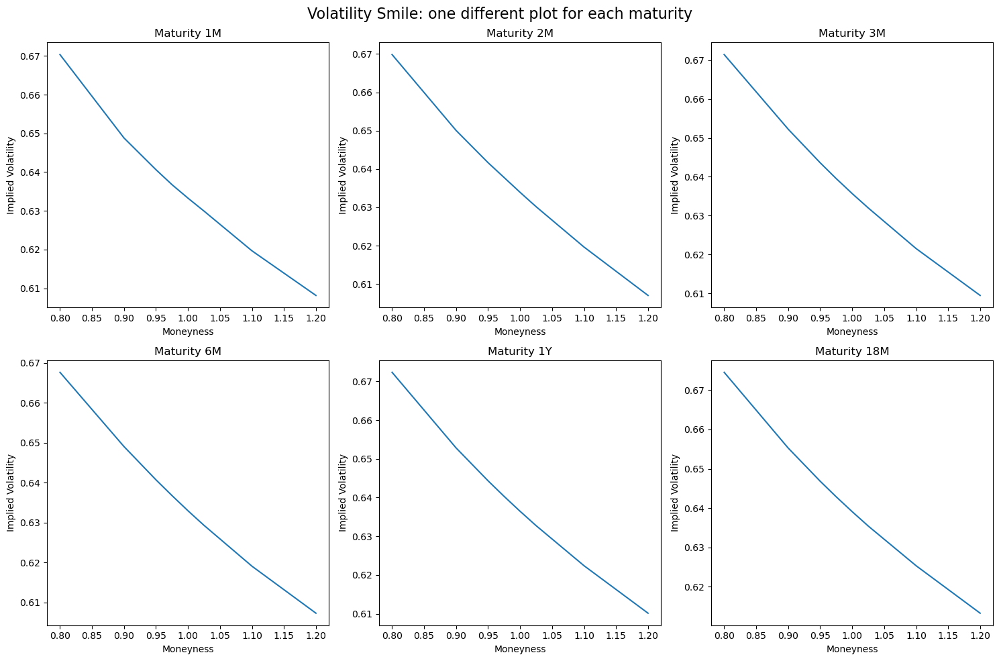

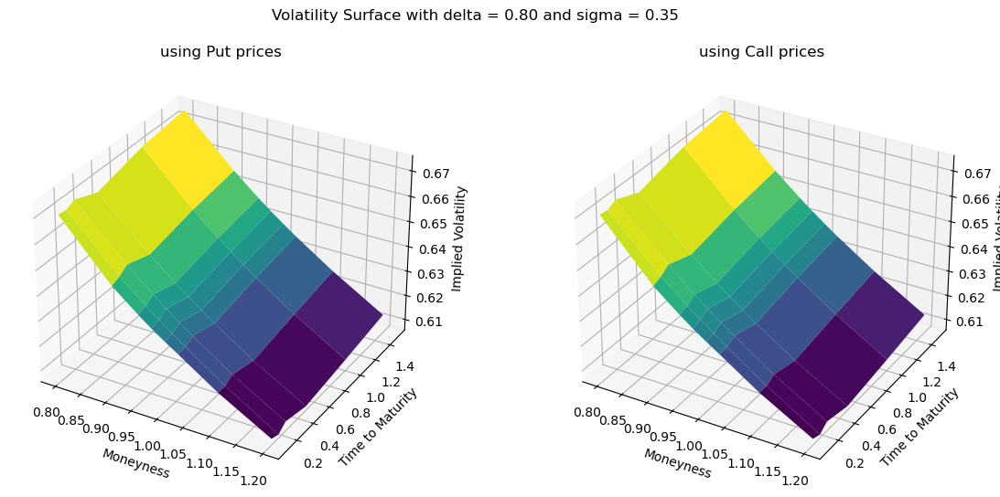







Implied volatilities with delta = 0.20 and sigma = 0.40


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.499829  0.486989  0.484376  0.483121   0.48218  0.481323  0.477939  0.474475
2M   0.495011  0.487614  0.484765  0.483578  0.482295  0.481024  0.477368  0.473289
3M   0.495335  0.488866  0.485965   0.48459  0.483316  0.482111  0.478678  0.474934
6M    0.49026  0.485051  0.482524  0.481303  0.480119  0.478992  0.475839  0.472618
1Y    0.49141  0.485484  0.482912  0.481709  0.480556   0.47944  0.476311  0.472679
18M  0.490035  0.484718  0.482397  0.481329  0.480306  0.479332  0.476602  0.473097




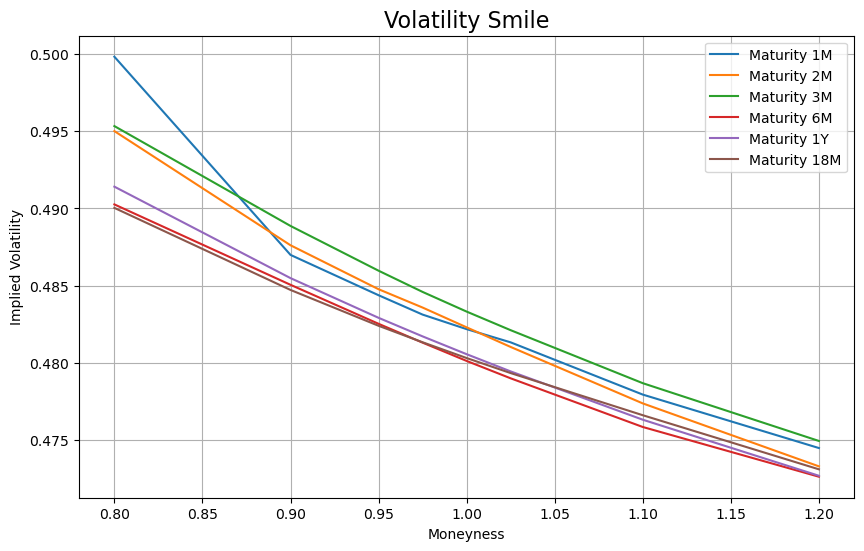

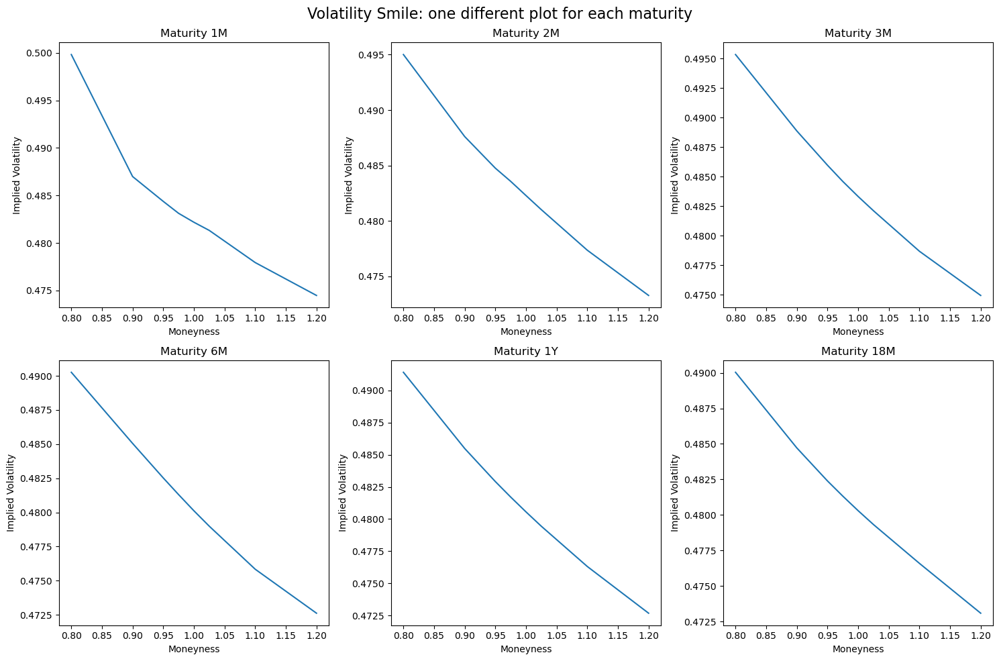

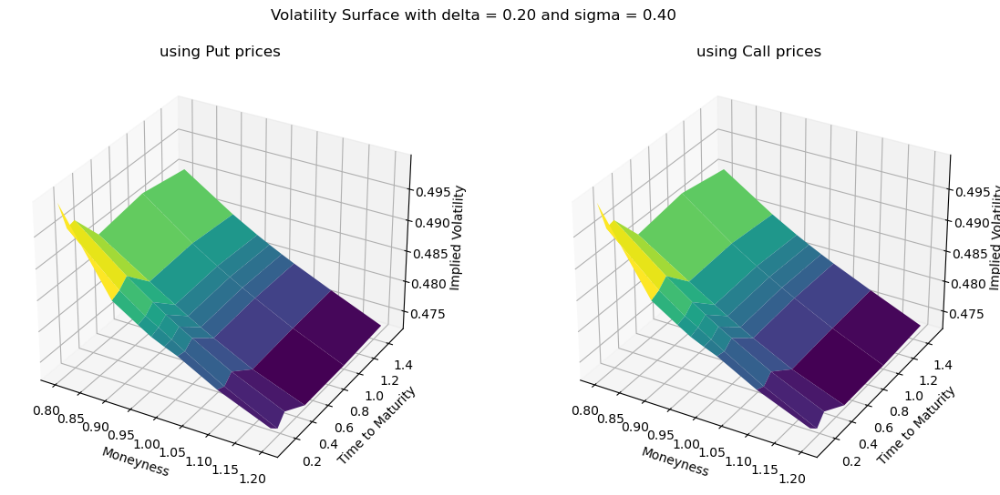







Implied volatilities with delta = 0.40 and sigma = 0.40


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.587424  0.571799  0.566965   0.56466  0.562707  0.560857   0.55469  0.548145
2M   0.584933  0.572668  0.567586  0.565332  0.563007  0.560753  0.554373  0.546812
3M   0.585948  0.574372  0.569133  0.566677  0.564367  0.562173  0.555912   0.54881
6M   0.581169  0.570513  0.565654   0.56334   0.56112  0.558994  0.553015  0.546394
1Y   0.583425  0.572068  0.567164  0.564851  0.562634  0.560494   0.55452  0.547481
18M  0.583191  0.572381  0.567657  0.565466   0.56336  0.561343  0.555726  0.548859




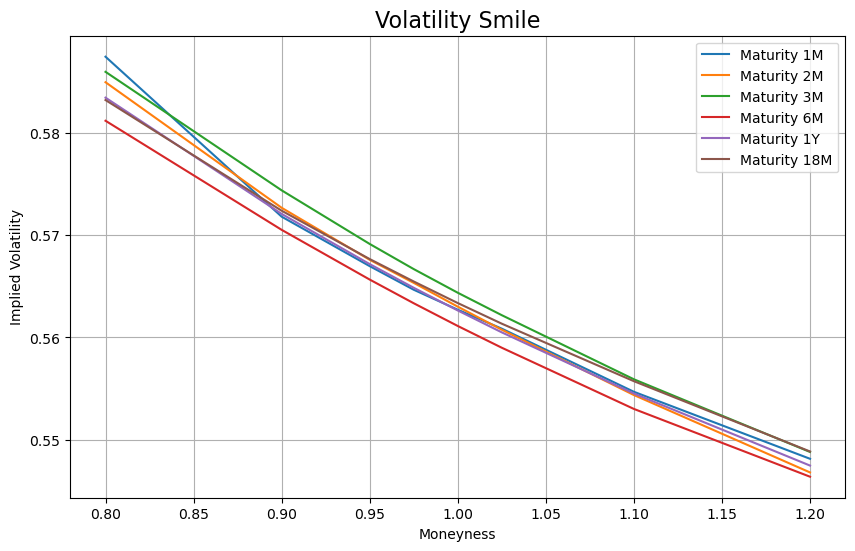

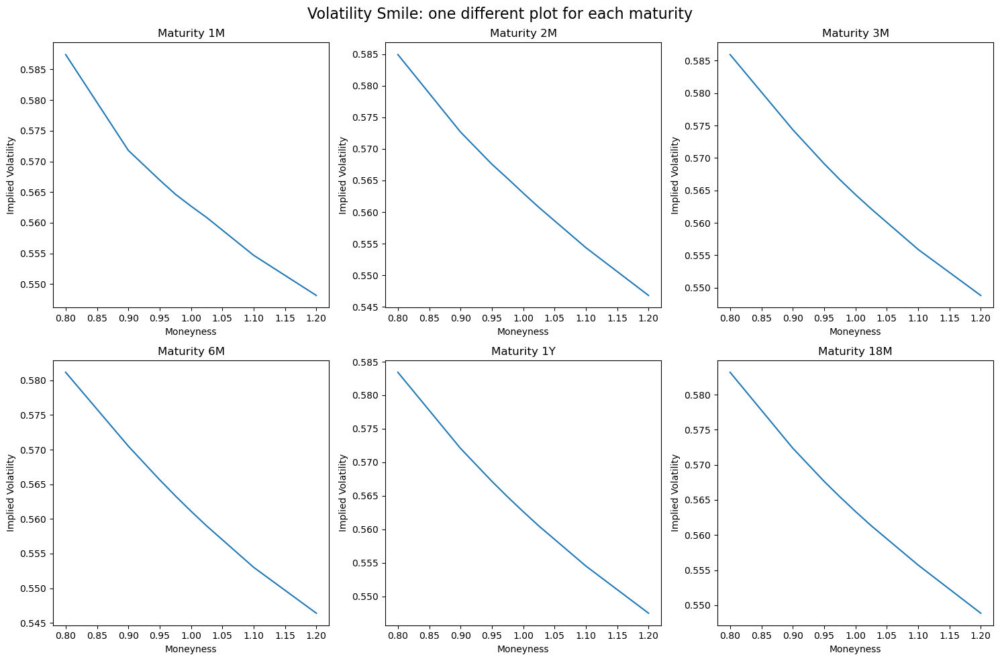

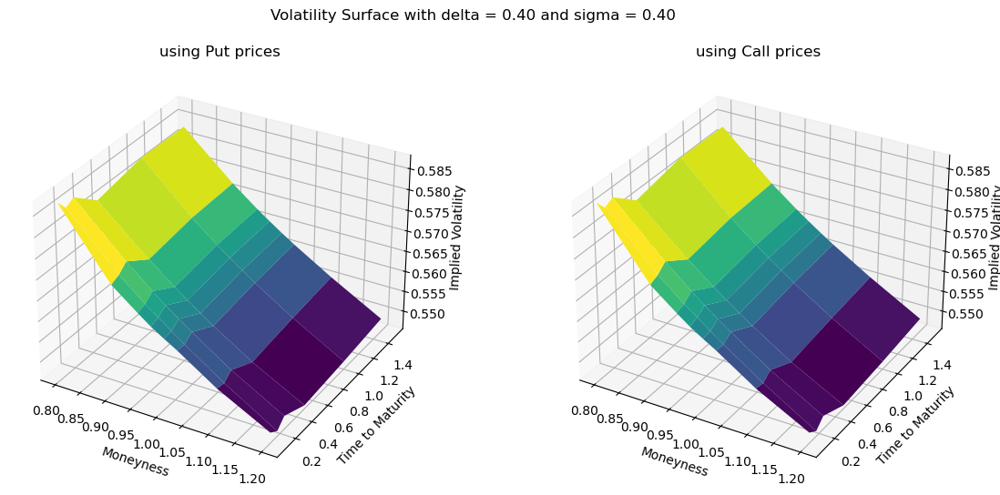







Implied volatilities with delta = 0.60 and sigma = 0.40


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.675614  0.656712  0.649597  0.646288  0.643311  0.640467  0.631562  0.621681
2M   0.675136  0.657857  0.650575  0.647239  0.643871  0.640624  0.631471  0.620511
3M   0.676839  0.660088  0.652534  0.649007  0.645649  0.642458  0.633347   0.62295
6M   0.672534  0.656474  0.649272  0.645853  0.642583  0.639441  0.630609  0.620544
1Y   0.676578  0.659734   0.65243  0.648979  0.645671  0.642477  0.633578  0.623046
18M  0.678206  0.661713  0.654495  0.651134  0.647897  0.644793   0.63616  0.625795




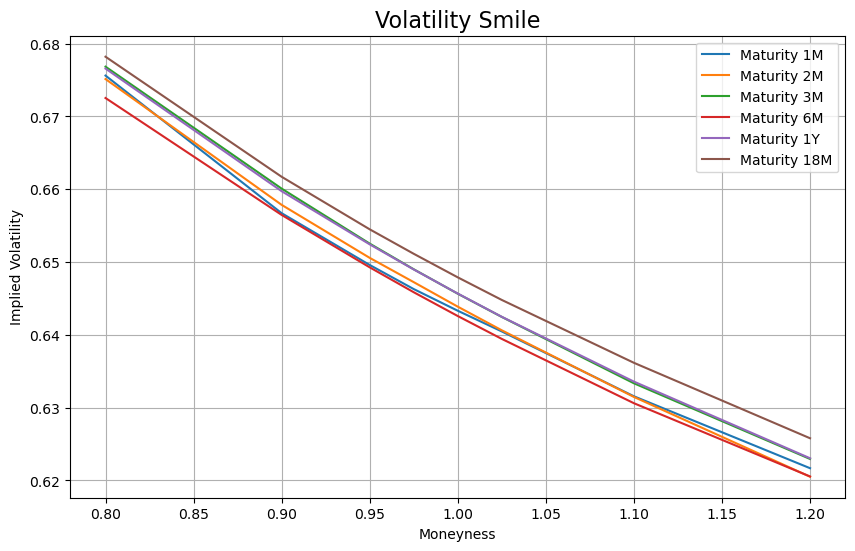

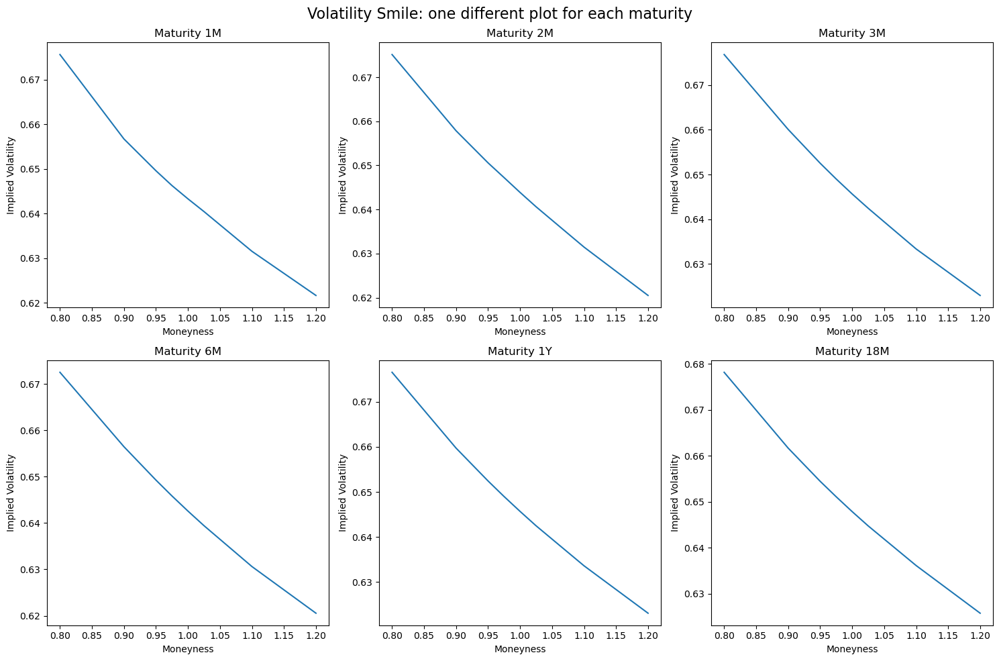

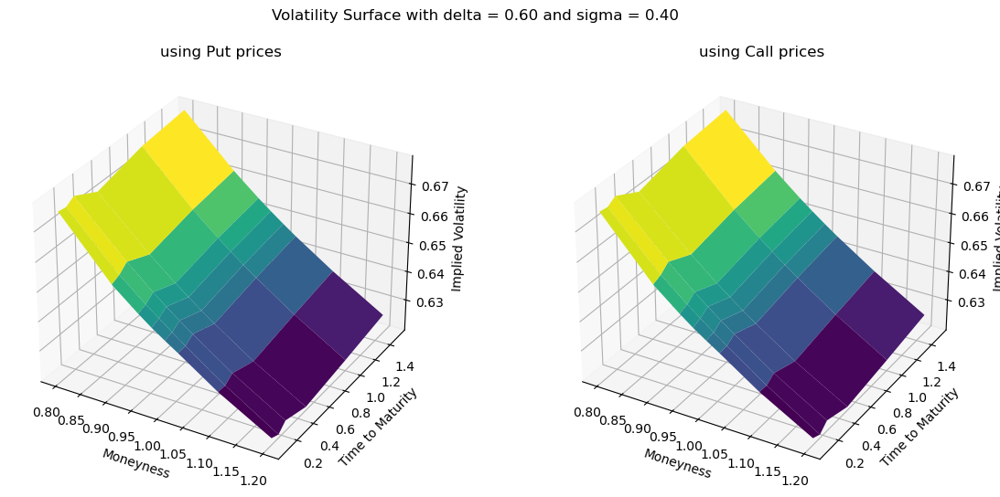







Implied volatilities with delta = 0.80 and sigma = 0.40


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M    0.76437  0.741765  0.732324  0.727998  0.724001  0.720164   0.70854  0.695297
2M   0.765577  0.743285  0.733772  0.729324  0.724912  0.720665  0.708696  0.694366
3M   0.768094  0.746068  0.736215   0.73161    0.7272  0.722997  0.711035  0.697246
6M   0.764526  0.743031  0.733459  0.728921  0.724583  0.720409  0.708691  0.695139
1Y   0.771173    0.7487  0.738897  0.734272  0.729837  0.725554  0.713619  0.699499
18M  0.775553  0.753059  0.743228  0.738633  0.734209  0.729963  0.718152  0.704083




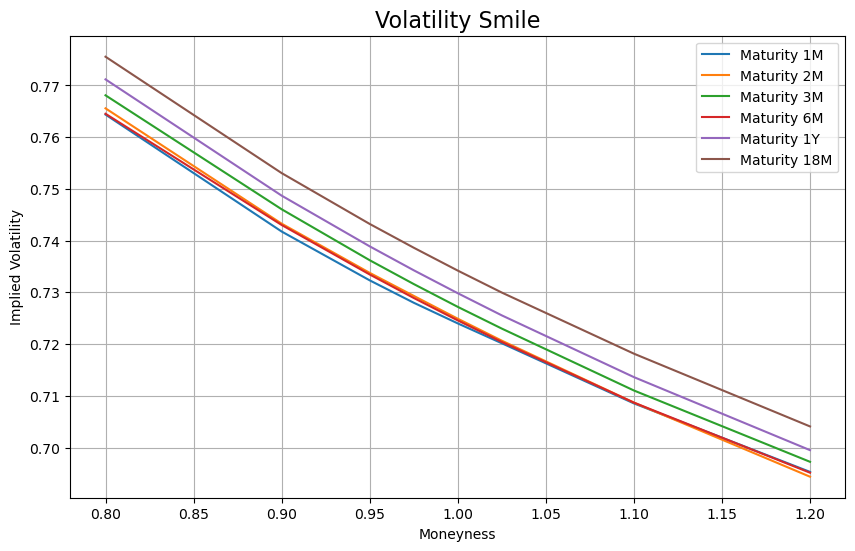

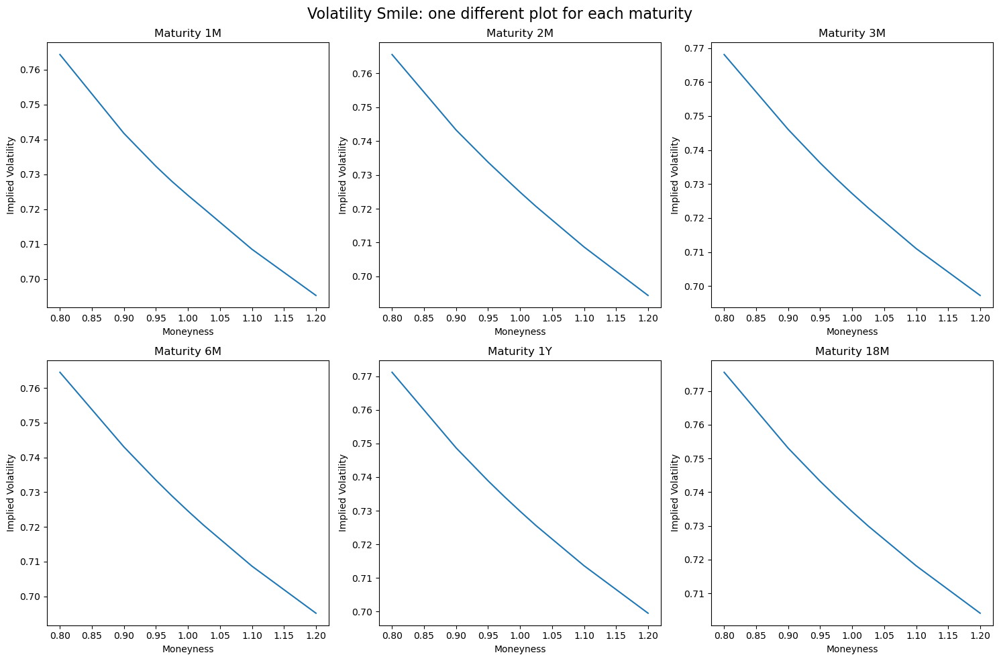

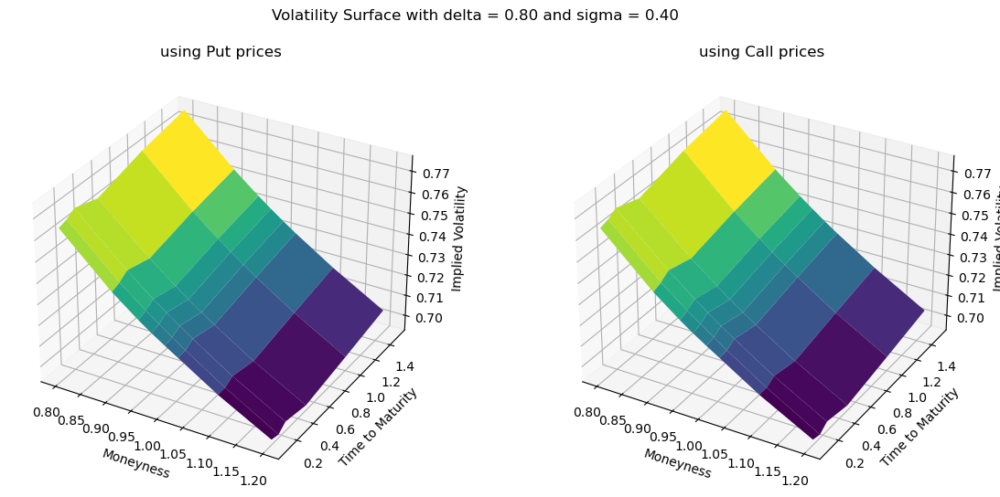







Implied volatilities with delta = 0.20 and sigma = 0.60


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.740703  0.730585  0.726733  0.725106  0.723649  0.722276  0.717437  0.712403
2M   0.741037  0.731435  0.727627  0.725746  0.723907  0.722091   0.71707  0.710971
3M   0.743164  0.733753  0.729566  0.727655  0.725845  0.724073  0.719091  0.713601
6M   0.736765  0.728327  0.724533  0.722771  0.721073  0.719404  0.714856  0.709865
1Y   0.738375  0.729734  0.725958  0.724179  0.722454  0.720833  0.716252  0.710901
18M  0.737662  0.729624  0.726151  0.724517  0.722953  0.721424  0.717065   0.71175




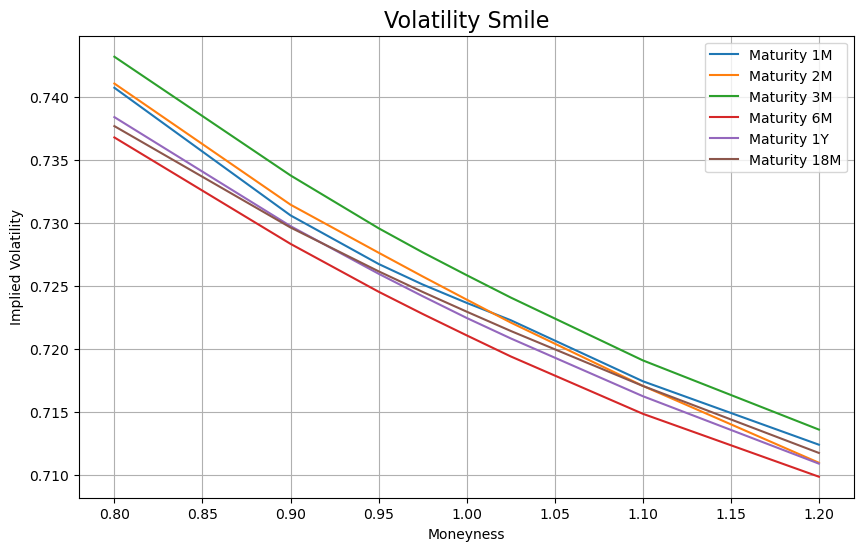

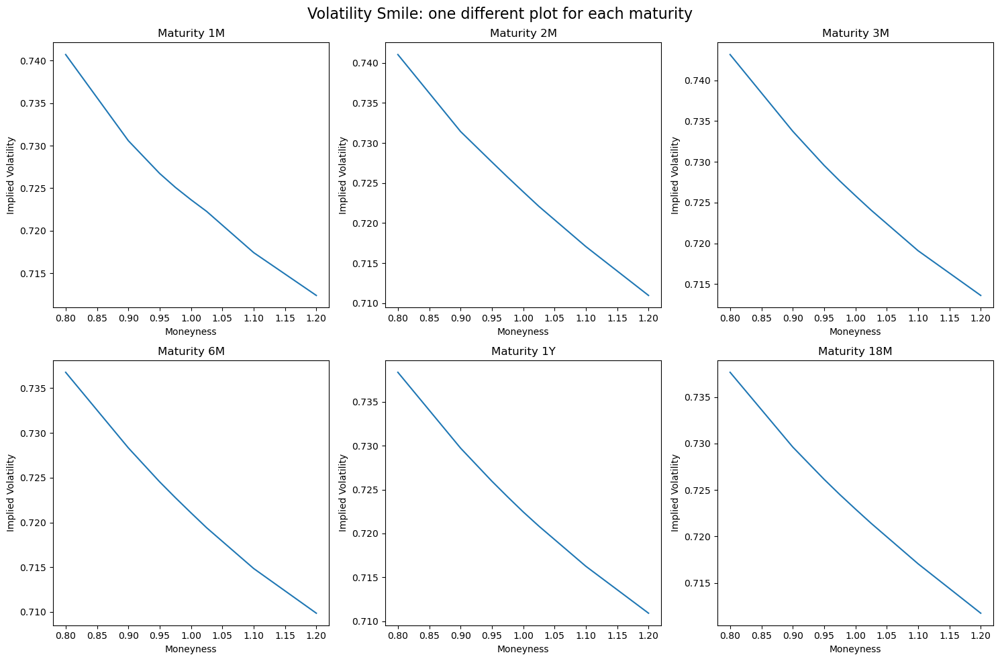

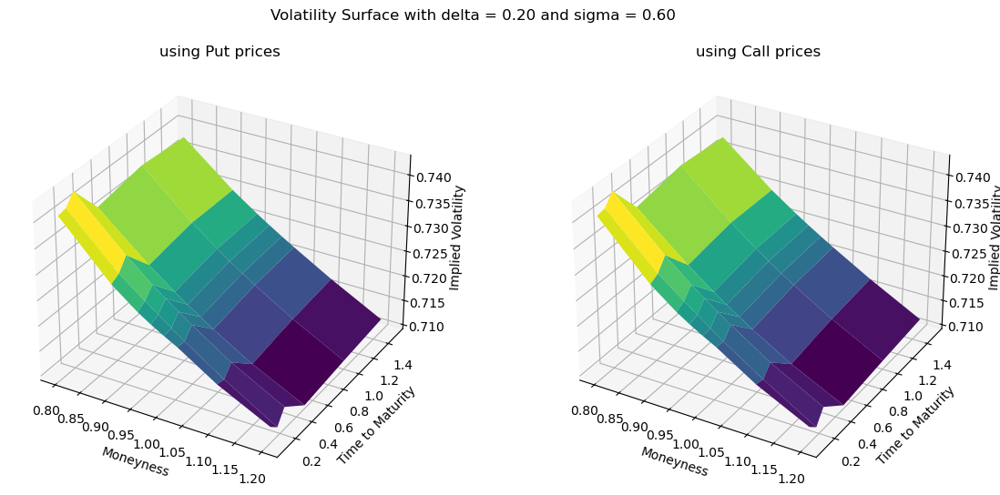







Implied volatilities with delta = 0.40 and sigma = 0.60


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   0.875168  0.858265  0.851001  0.847827  0.844813  0.841951  0.833067  0.822833
2M   0.877074  0.859838  0.852605  0.849072  0.845676  0.842364  0.833123  0.822055
3M   0.880596  0.863118  0.855458  0.851899  0.848516   0.84523  0.835979  0.825438
6M   0.875334  0.858706  0.851351  0.847919  0.844614  0.841397  0.832525  0.822404
1Y   0.881413  0.864248  0.856733   0.85319  0.849776  0.846534   0.83744  0.826761
18M  0.885293  0.868279  0.860883  0.857407  0.854075  0.850847  0.841775  0.830898




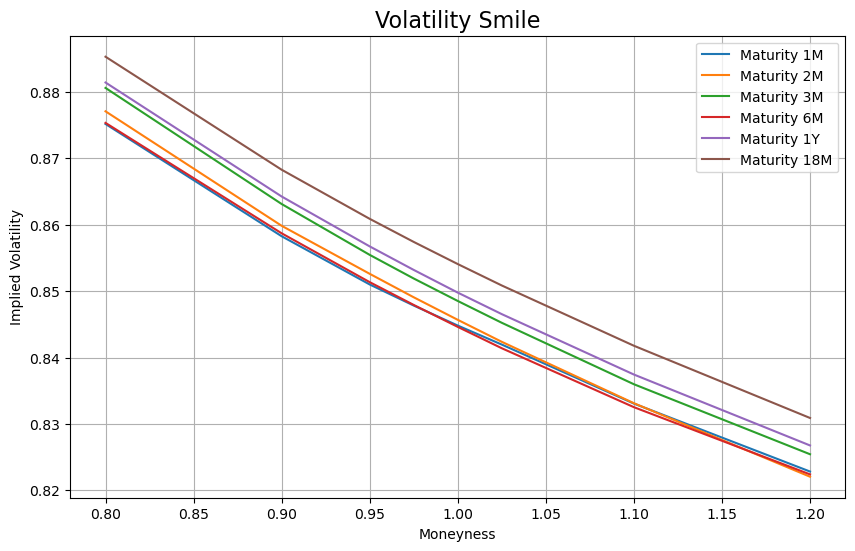

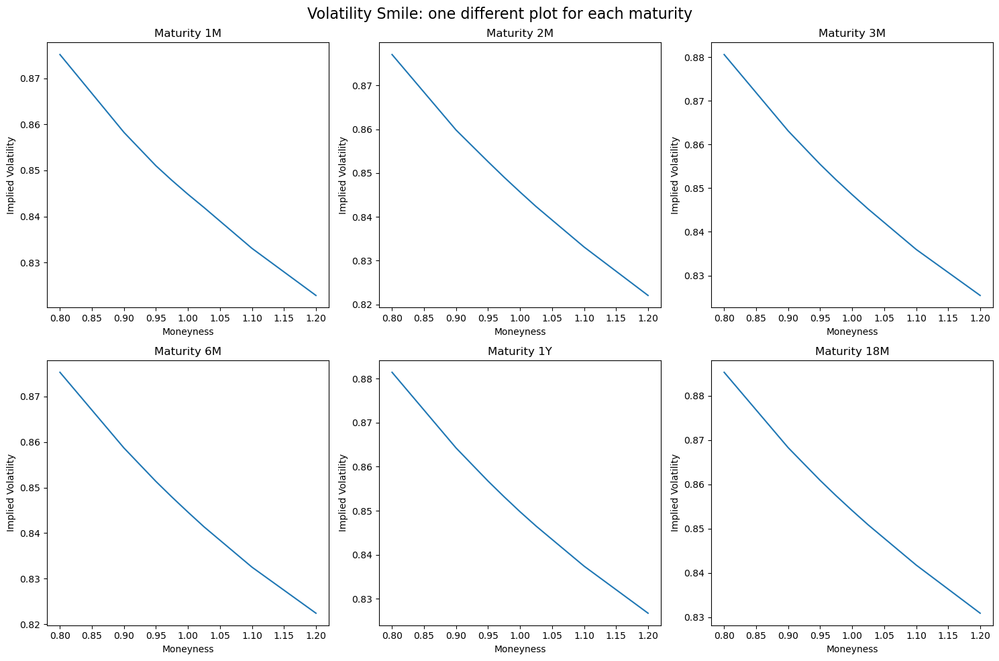

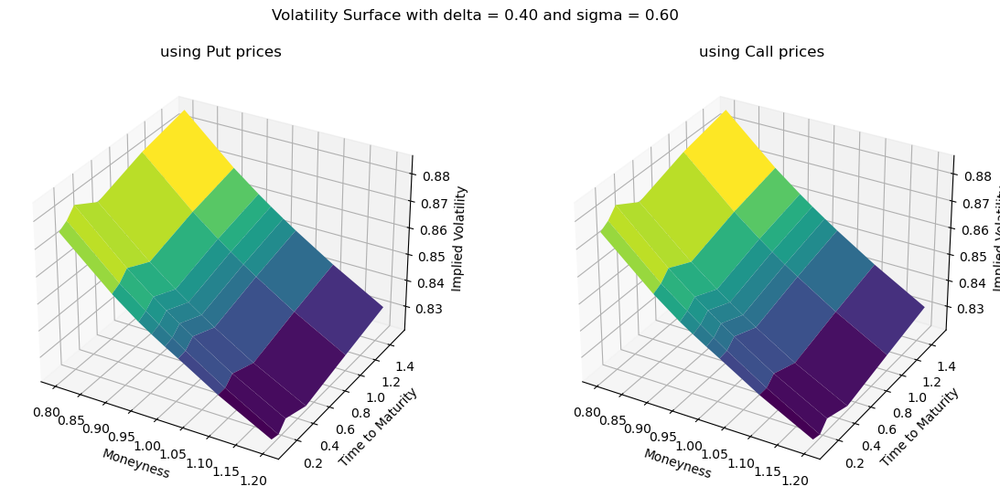







Implied volatilities with delta = 0.60 and sigma = 0.60


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   1.010644  0.986263  0.975567   0.97081  0.966237  0.961877  0.948979  0.933434
2M   1.013881  0.988834  0.978122  0.972936   0.96797  0.963139  0.949625  0.933597
3M   1.018986   0.99337  0.982198   0.97697   0.97199  0.967165  0.953576  0.937871
6M   1.015914  0.990908    0.9799  0.974749  0.969789  0.964979  0.951645  0.936225
1Y   1.029083  1.002784  0.991279  0.985853  0.980643  0.975672  0.961768  0.945413
18M  1.040461  1.013494  1.001749  0.996238  0.990955  0.985855  0.971583  0.954624




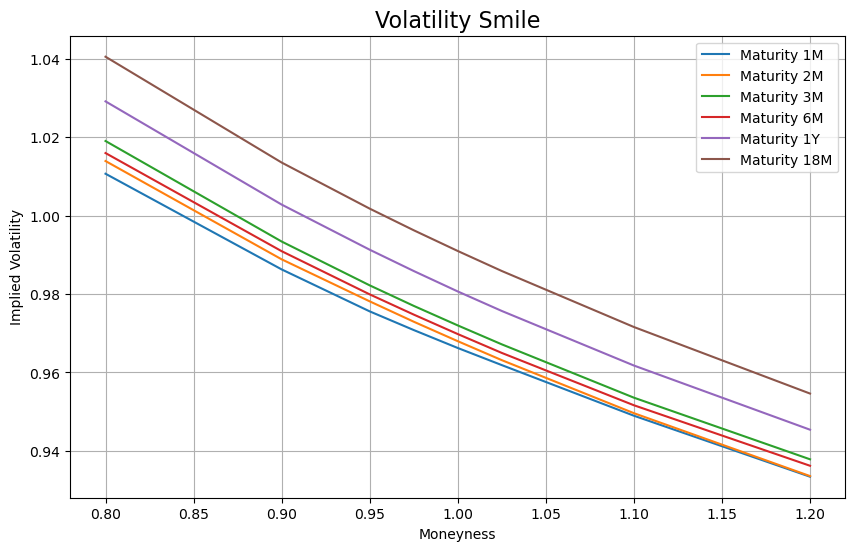

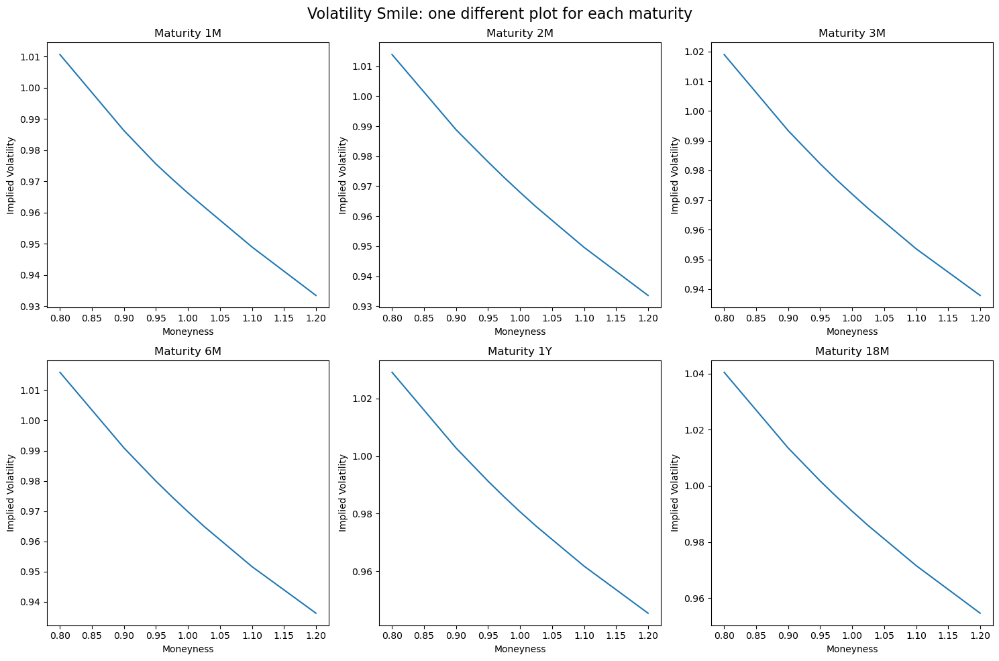

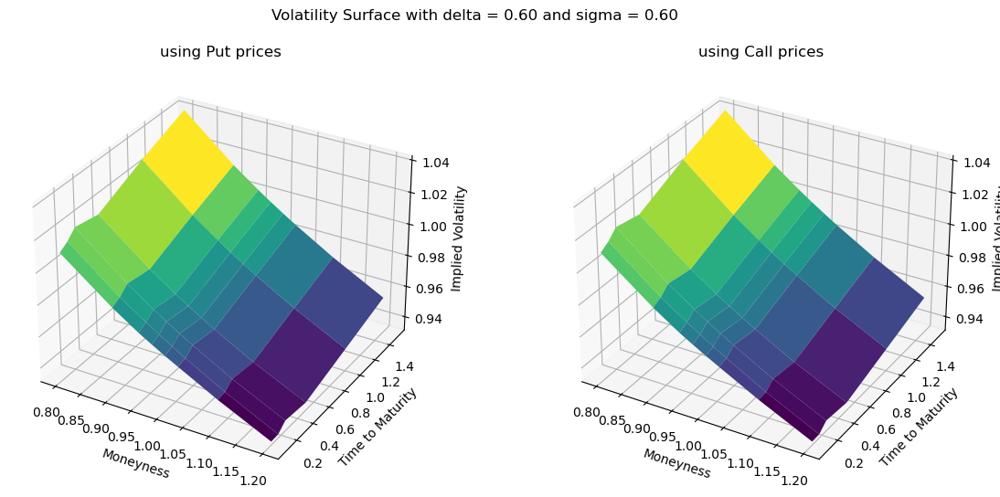







Implied volatilities with delta = 0.80 and sigma = 0.60


        0.800     0.900     0.950     0.975     1.000     1.025     1.100     1.200
1M   1.146591  1.114524  1.100465  1.094096  1.087957  1.082091  1.065123  1.044332
2M   1.151374  1.118527  1.104281  1.097425   1.09087  1.084501  1.066647  1.045601
3M    1.15847  1.124661  1.109931     1.103  1.096397  1.090006  1.071999  1.051053
6M   1.158965  1.125283  1.110505  1.103568  1.096893  1.090431  1.072486  1.051566
1Y   1.182509  1.146292  1.130463  1.123004  1.115852  1.109015  1.089925  1.067467
18M  1.205608  1.167191    1.1505  1.142681  1.135188   1.12797  1.107834  1.084075




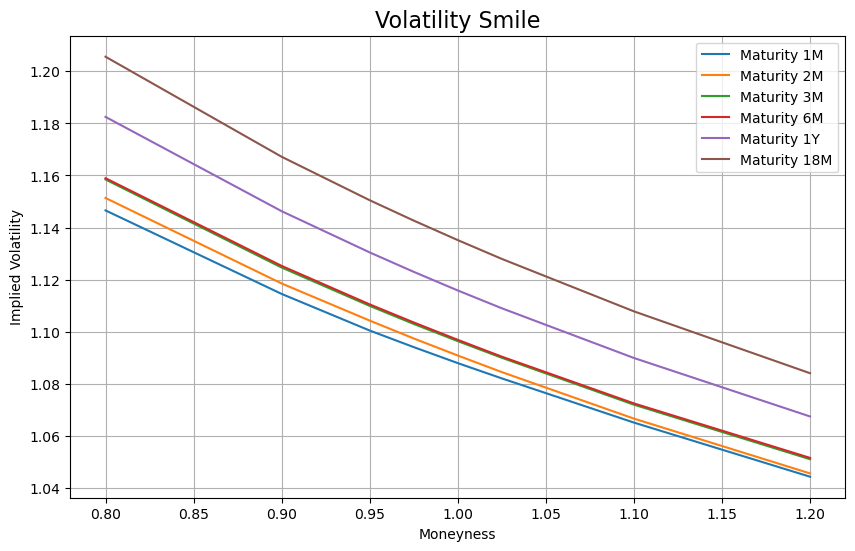

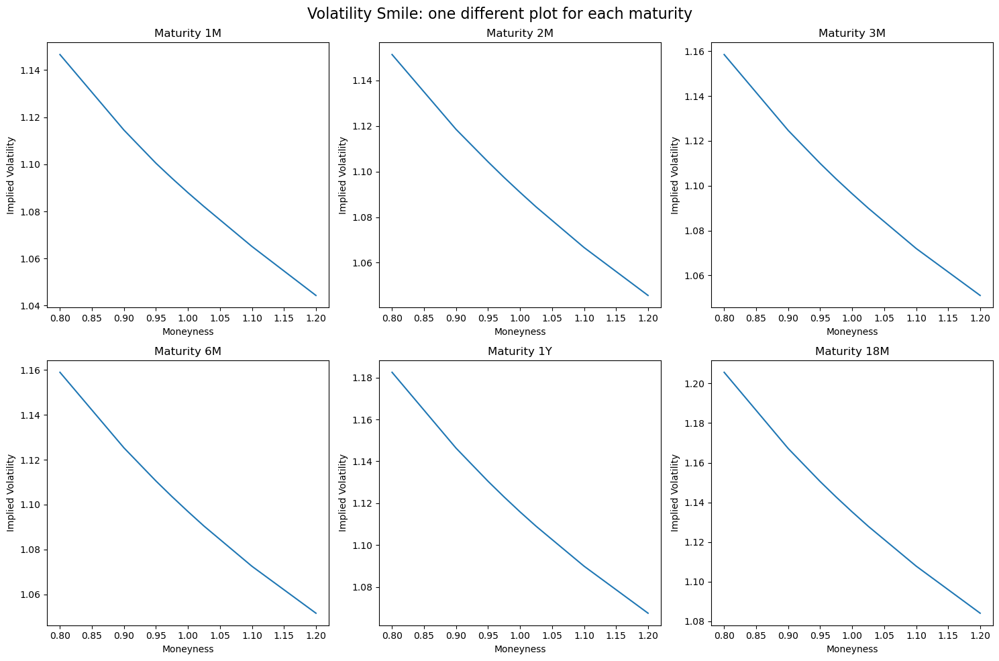

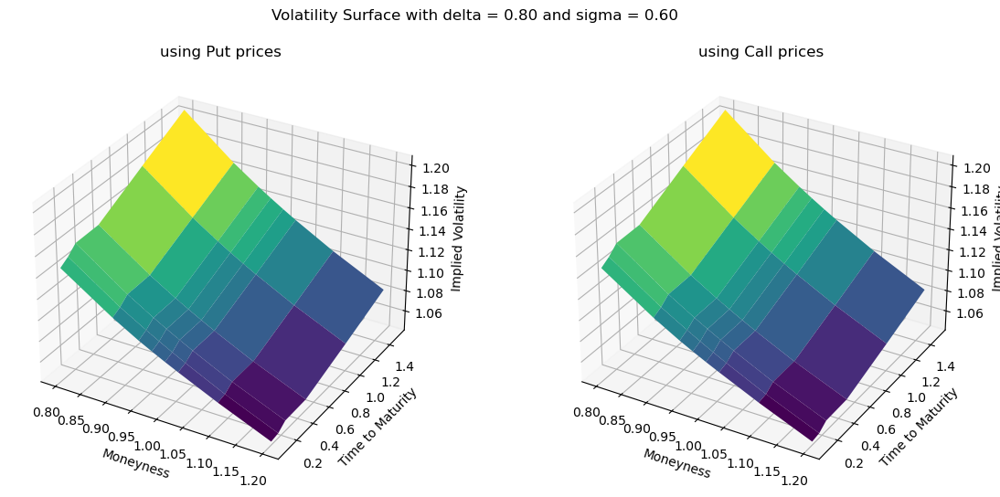

In [14]:
t1 = ['1M','2M','3M','6M','1Y','18M']
for s in sigma:
    for d in delta:
        S = S_t_process(S_0,Nt,NS,s,d,Yrs)
        prices1 = np.zeros((6,len(Strikes)))
        vol1 = np.zeros((6,len(Strikes)))
        prices2 = np.zeros((6,len(Strikes)))
        vol2 = np.zeros((6,len(Strikes)))
        for i in range(len(Strikes)):
    
            prices1[:,i] = MC_DD(S,Strikes[i],NS)[:,0]
            prices2[:,i] = MC_DD(S,Strikes[i],NS)[:,1]
        
        for i in range(len(Strikes)):
            for j in range(6):
        
                vol1[j,i] = impVolFromFwPut(prices1[j,i], t[j], Strikes[i]) 
                vol2[j,i] = impVolFromFwCall(prices2[j,i], t[j], Strikes[i])

           
        dfVol = pd.DataFrame(index=t1, columns=Strikes)
        for i in range(len(t)):
            dfVol.iloc[i] = vol1[i].tolist()
            
        print('Implied volatilities with delta = {:.2f} and sigma = {:.2f}'.format(d,s))
        print('\n')
        print(dfVol.to_string())
        print('\n')
        
        
        # volatility smile: one graph with all the maturities
        plt.figure(figsize=(10, 6))
        for i in range(len(t)):
            plt.plot(Strikes, vol1[i], label=f'Maturity {t1[i]}')
        plt.title('Volatility Smile', fontsize=16)
        plt.xlabel('Moneyness')
        plt.ylabel('Implied Volatility')
        plt.grid(True)
        plt.legend() 
        plt.show()
        
               
        # volatility smile: one different plot for each different maturity    
        fig, axs = plt.subplots(2, 3, figsize=(15, 10)) 

        for i, ax in enumerate(axs.flat):
            ax.plot(Strikes, vol1[i])
            ax.set_title(f'Maturity {t1[i]}')
            ax.set_xlabel('Moneyness')
            ax.set_ylabel('Implied Volatility')
            ax.grid(False)

        fig.suptitle('Volatility Smile: one different plot for each maturity', fontsize=16)
        plt.tight_layout()
        plt.show()

        
        # volatility surfaces
        X, Y = np.meshgrid(Strikes,t)
        fig = plt.figure(figsize=(14, 6))

        ax1 = fig.add_subplot(121, projection='3d')
        ax1.plot_surface(X, Y, vol1, cmap='viridis')
        ax1.set_xlabel('Moneyness')
        ax1.set_ylabel('Time to Maturity')
        ax1.set_zlabel('Implied Volatility')
        ax1.set_title('using Put prices')

        ax2 = fig.add_subplot(122, projection='3d')
        ax2.plot_surface(X, Y, vol2, cmap='viridis')
        ax2.set_xlabel('Moneyness')
        ax2.set_ylabel('Time to Maturity')
        ax2.set_zlabel('Implied Volatility')
        ax2.set_title('using Call prices')
        
        fig.suptitle('Volatility Surface with delta = {:.2f} and sigma = {:.2f}'.format(d,s))
        plt.show()
        
        print("\n")
        print("\n")
        print("\n")